(mmm_example)=
# MMM Example Notebook

In this notebook we work out a simulated example to showcase the media mix Model (MMM) API from `pymc-marketing`. This package provides a `pymc` implementation of the MMM presented in the paper [Jin, Yuxue, et al. “Bayesian methods for media mix modeling with carryover and shape effects.” (2017)](https://research.google/pubs/pub46001/). We work with synthetic data as we want to do *parameter recovery* to better understand the model assumptions. That is, we explicitly set values for our adstock and saturation parameters (see model specification below) and recover them back from the model. The data generation process is as an adaptation of the blog post ["Media Effect Estimation with PyMC: Adstock, Saturation & Diminishing Returns"](https://juanitorduz.github.io/pymc_mmm/) by [Juan Orduz](https://juanitorduz.github.io/).

## Business Problem

Before jumping into the data, let's first define the business problem we are trying to solve. We are a marketing agency and we want to optimize the marketing budget of a client. We have access to the following data:

- Sales data: weekly sales of the client.
- Media spend data: weekly spend on different media channels (e.g. TV, radio, online, etc.). In this example we consider 2 media channels: $x_{1}$ and $x_{2}$.
- Domain knowledge: 
  - We know that there has a been an positive sales trend which we believe comes from a strong economic growth.
  - We also know that there is a yearly seasonality effect.
  - In addition, we were informed about two outliers in the data during the weeks `2019-05-13` and `2021-09-14`.

Given this information we can draw a Directed Acyclic Graph (DAG) or graphical model of how we believe our variables are related. In other words, represent how we believe our system is causally related.

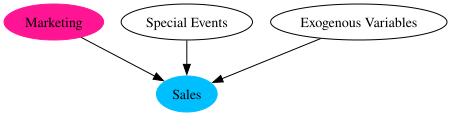

In [1]:
import graphviz as gr

g = gr.Digraph()
g.node(name="Sales", label="Sales", color="deepskyblue", style="filled")
g.node(name="Marketing", label="Marketing", color="deeppink", style="filled")
g.edge(tail_name="Special Events", head_name="Sales")
g.edge(tail_name="Marketing", head_name="Sales")
g.edge(tail_name="Exogenous Variables", head_name="Sales")
g

In this example, we will consider a simple system where:
- **Marketing**: It represents the actions generated by $x_{1}$ and $x_{2}$.
- **Special Events**: Outliers on specific days, which are possibly given by special dates.
- **Exogenous Variables**: We will consider variables that are determined by external factors, not determined in the model (E.g: Country economic growth or weather conditions that determine seasonal behavior).

Understanding this ecosystem is essential to create a model that reveals the true causal signals and allows us to optimize our advertising budget. But, What do we mean by optimize the marketing budget? We want to find the optimal media mix that maximizes sales.

Now, given the DAG outlined above, we understand that there is a causal relationship between marketing and sales, but *what is the nature of that relationship*? In this case, we will assume that this relationship is not linear, for example, a $10\%$ increase in channel $x_{1}$ spend does not necessarily translate into a $10\%$ increase in sales. This can be explained by two phenomena:

1. On the one hand side, there is a carry-over effect. Meaning, the effect of spend on sales is not instantaneous but accumulates over time.
2. In addition, there is a saturation effect. Meaning, the effect of spend on sales is not linear but saturates at some point.

The equation implemented to describe the DAG presented above will be the one expressed in [Jin, Yuxue, et al. “Bayesian methods for media mix modeling with carryover and shape effects.” (2017)](https://research.google/pubs/pub46001/), adding a causal assumption around the media effects and their exclusively positive impact. Concretely, given a time series target variable $y_{t}$ (e.g. sales or conversions), media variables $x_{m, t}$ (e.g. impressions, clicks or costs) and a set of control covariates $z_{c, t}$ (e.g. holidays, special events) we consider a linear model of the form 

$$
y_{t} = \alpha + \sum_{m=1}^{M}\beta_{m}f(x_{m, t}) +  \sum_{c=1}^{C}\gamma_{c}z_{c, t} + \varepsilon_{t},
$$

where $\alpha$ is the intercept, $f$ is a media transformation function and $\varepsilon_{t}$ is the error term which we assume is normally distributed. The function $f$ encodes the positive media contribution on the target variable. Typically we consider two types of transformation: adstock (carry-over) and saturation effects.

In **PyMC-Marketing**, we offer an API for a Bayesian Media Mix Model (MMM) with various specifications. In the example, we’ll implement `Geometric Adstock` and `Logistic Saturation` as the chosen transformations for our previously discussed Structural Causal Equation.

```{tip}
The MMM model in `pymc-marketing` provides additional features on top of this base model:

- **Experiment Calibration**: We have the option to add empirical experiments (lift tests) to calibrate the model using custom likelihood functions. See {ref}`mmm_lift_test`.

- **Time-varying Intercept:** Capture time-varying baseline contributions in your model (using modern and efficient Gaussian processes approximation methods). That is, we allow the intercept term $\alpha = \alpha(t)$ to vary over time. See {ref}`mmm_tvp_example`.

- **Budget Optimization:** Allocate your marketing budget based on the parameters recover by the model, finding the spend distribution to maximizes the amount of contribution given a limited budget. See {ref}`mmm_budget_allocation_example`.
```

### References:

- [Jin, Yuxue, et al. “Bayesian methods for media mix modeling with carryover and shape effects.” (2017).](https://research.google/pubs/pub46001/)
- PyMC Labs Blog:
  - [Bayesian Media Mix Modeling for Marketing Optimization](https://www.pymc-labs.com/blog-posts/bayesian-media-mix-modeling-for-marketing-optimization/)
  - [Improving the Speed and Accuracy of Bayesian Media Mix Models](https://www.pymc-labs.com/blog-posts/reducing-customer-acquisition-costs-how-we-helped-optimizing-hellofreshs-marketing-budget/)
- [Johns, Michael and Wang,  Zhenyu. "A Bayesian Approach to Media Mix Modeling"](https://www.youtube.com/watch?v=UznM_-_760Y)
- [Orduz, Juan. "Media Effect Estimation with PyMC: Adstock, Saturation & Diminishing Returns"](https://juanitorduz.github.io/pymc_mmm/)

---

## Part I: Data Generation Process

In Part I of this notebook we focus on the data generating process. That is, we want to construct the target variable $y_{t}$ (sales) by adding each of the components described in the *Business Problem* section.

## Prepare Notebook

In [2]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pymc_extras.prior import Prior

from pymc_marketing.mmm import GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.multidimensional import MMM
from pymc_marketing.mmm.transformers import geometric_adstock, logistic_saturation

warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/carlostrujillo/Documents/GitHub/pymc-marketing/pymc_marketing/mmm/multidimensional.py:216: FutureWarning: This functionality is experimental and subject to change. If you encounter any issues or have suggestions, please raise them at: https://github.com/pymc-labs/pymc-marketing/issues/new
  warnings.warn(warning_msg, FutureWarning, stacklevel=1)


## Generate Data

### 1. Date Range

First we set a time range for our data. We consider a bit more than 2 years of data at weekly granularity.

In [3]:
seed: int = sum(map(ord, "mmm"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

# date range
min_date = pd.to_datetime("2018-04-01")
max_date = pd.to_datetime("2021-09-01")

df = pd.DataFrame(
    data={"date_week": pd.date_range(start=min_date, end=max_date, freq="W-MON")}
).assign(
    year=lambda x: x["date_week"].dt.year,
    month=lambda x: x["date_week"].dt.month,
    dayofyear=lambda x: x["date_week"].dt.dayofyear,
)

n = df.shape[0]
print(f"Number of observations: {n}")

Number of observations: 179


### 2. Media Costs Data

Now we generate synthetic data from two channels $x_1$ and $x_2$. We refer to it as the raw signal as it is going to be the input at the modeling phase. We expect the contribution of each channel to be different, based on the carryover and saturation parameters.

- Raw Signal

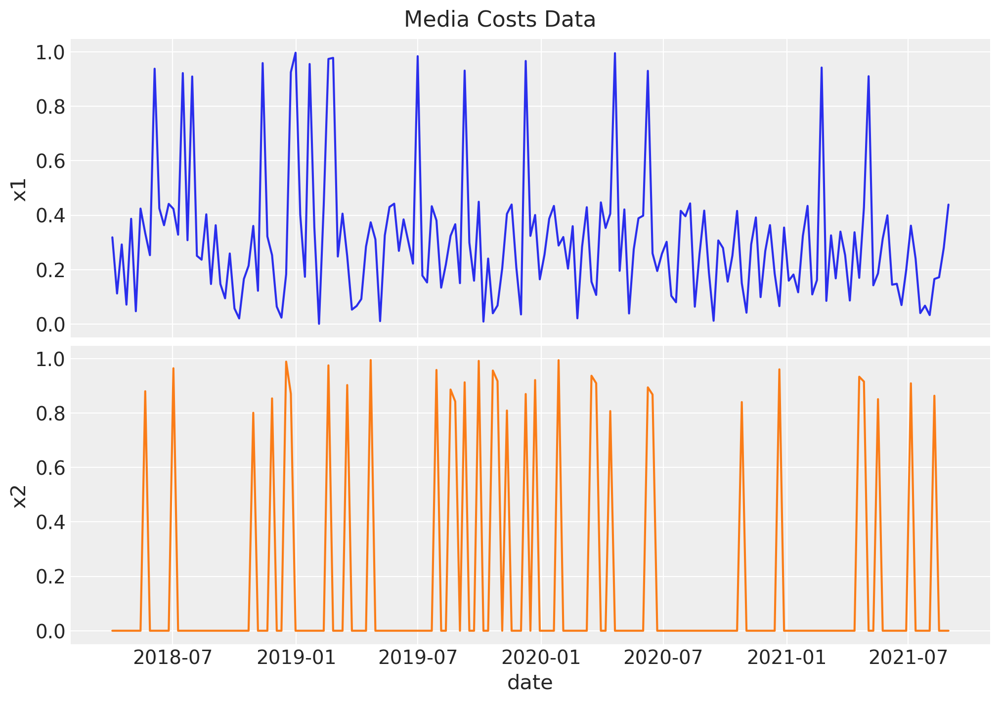

In [4]:
# media data
x1 = rng.uniform(low=0.0, high=1.0, size=n)
df["x1"] = np.where(x1 > 0.9, x1, x1 / 2)

x2 = rng.uniform(low=0.0, high=1.0, size=n)
df["x2"] = np.where(x2 > 0.8, x2, 0)


fig, ax = plt.subplots(
    nrows=2, ncols=1, figsize=(10, 7), sharex=True, sharey=True, layout="constrained"
)
sns.lineplot(x="date_week", y="x1", data=df, color="C0", ax=ax[0])
sns.lineplot(x="date_week", y="x2", data=df, color="C1", ax=ax[1])
ax[1].set(xlabel="date")
fig.suptitle("Media Costs Data", fontsize=16);

**Remark:** By design, $x_{1}$ should resemble a typical paid social channel and $x_{2}$ a offline (e.g. TV) spend time series.

- Effect Signal

Next, we pass the raw signal through the two transformations: first the geometric adstock (carryover effect) and then the logistic saturation. Note that we set the parameters ourselves, but we will recover them back from the model.

Let's start with the adstock transformation. We set the adstock parameter $0 < \alpha < 1$ to be $0.4$ and $0.2$ for $x_1$ and $x_2$ respectively. We set a maximum lag effect of $8$ weeks.

In [5]:
# apply geometric adstock transformation
alpha1: float = 0.4
alpha2: float = 0.2

df["x1_adstock"] = (
    geometric_adstock(x=df["x1"].to_numpy(), alpha=alpha1, l_max=8, normalize=True)
    .eval()
    .flatten()
)

df["x2_adstock"] = (
    geometric_adstock(x=df["x2"].to_numpy(), alpha=alpha2, l_max=8, normalize=True)
    .eval()
    .flatten()
)

Next, we compose the resulting adstock signals with the logistic saturation function. We set the parameter $\lambda > 0$ to be $4$ and $3$ for $z_1$ and $z_2$ respectively.

In [6]:
# apply saturation transformation
lam1: float = 4.0
lam2: float = 3.0

df["x1_adstock_saturated"] = logistic_saturation(
    x=df["x1_adstock"].to_numpy(), lam=lam1
).eval()

df["x2_adstock_saturated"] = logistic_saturation(
    x=df["x2_adstock"].to_numpy(), lam=lam2
).eval()

We can now visualize the effect signal for each channel after each transformation:

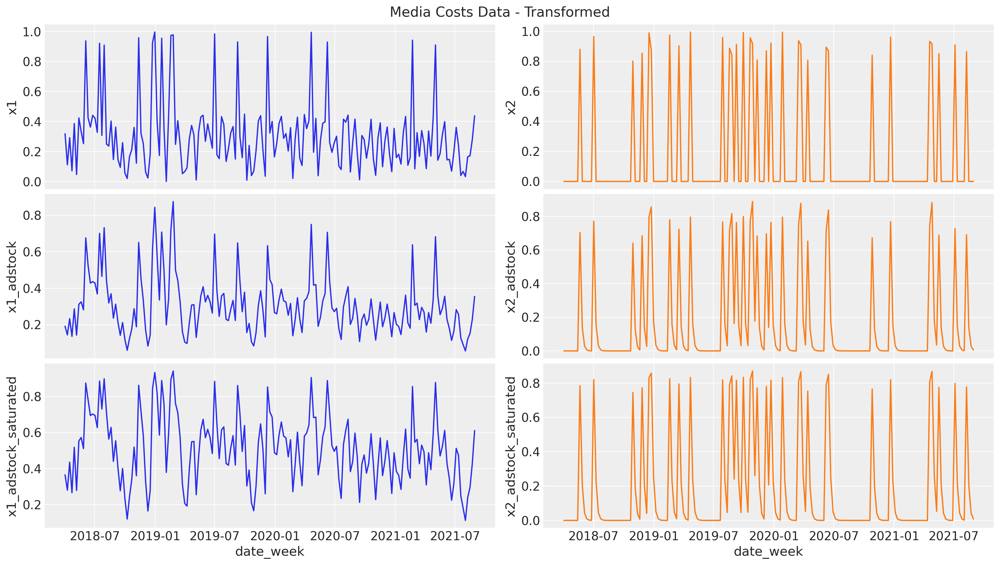

In [7]:
fig, ax = plt.subplots(
    nrows=3, ncols=2, figsize=(16, 9), sharex=True, sharey=False, layout="constrained"
)
sns.lineplot(x="date_week", y="x1", data=df, color="C0", ax=ax[0, 0])
sns.lineplot(x="date_week", y="x2", data=df, color="C1", ax=ax[0, 1])
sns.lineplot(x="date_week", y="x1_adstock", data=df, color="C0", ax=ax[1, 0])
sns.lineplot(x="date_week", y="x2_adstock", data=df, color="C1", ax=ax[1, 1])
sns.lineplot(x="date_week", y="x1_adstock_saturated", data=df, color="C0", ax=ax[2, 0])
sns.lineplot(x="date_week", y="x2_adstock_saturated", data=df, color="C1", ax=ax[2, 1])
fig.suptitle("Media Costs Data - Transformed", fontsize=16);

### 3. Trend \& Seasonal Components

Now we add synthetic trend and seasonal components to the effect signal.

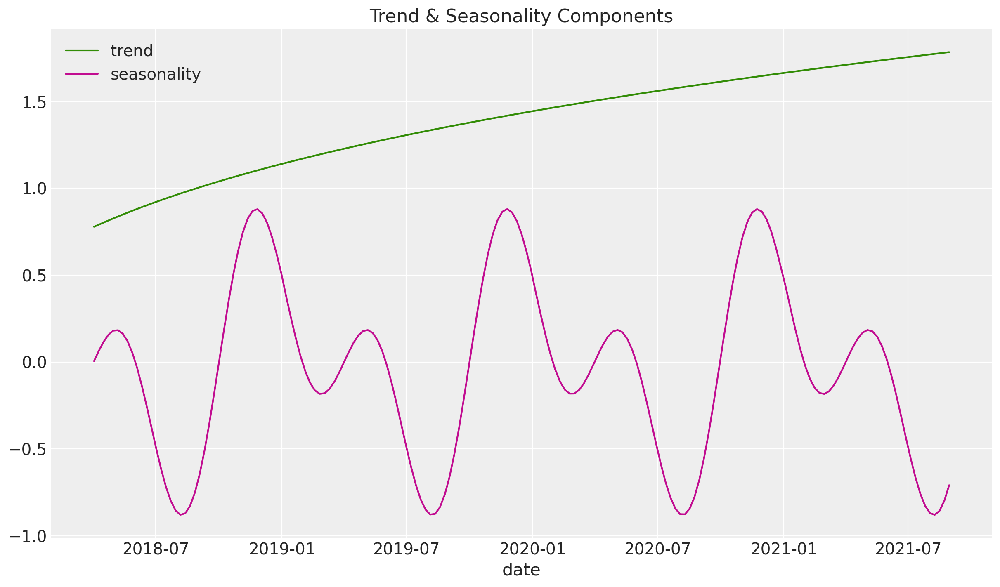

In [8]:
df["trend"] = (np.linspace(start=0.0, stop=50, num=n) + 10) ** (1 / 4) - 1

df["cs"] = -np.sin(2 * 2 * np.pi * df["dayofyear"] / 365.5)
df["cc"] = np.cos(1 * 2 * np.pi * df["dayofyear"] / 365.5)
df["seasonality"] = 0.5 * (df["cs"] + df["cc"])

fig, ax = plt.subplots()
sns.lineplot(x="date_week", y="trend", color="C2", label="trend", data=df, ax=ax)
sns.lineplot(
    x="date_week", y="seasonality", color="C3", label="seasonality", data=df, ax=ax
)
ax.legend(loc="upper left")
ax.set(title="Trend & Seasonality Components", xlabel="date", ylabel=None);

### 4. Control Variables

We add two *events* where there was a remarkable peak in our target variable. We assume they are independent and not seasonal (e.g. launch of a particular product). 

In [9]:
df["event_1"] = (df["date_week"] == "2019-05-13").astype(float)
df["event_2"] = (df["date_week"] == "2020-09-14").astype(float)

### 5. Target Variable

Finally, we define the target variable (sales) $y$. We assume it is a linear combination of the effect signal, the trend and the seasonal components, plus the two events and an intercept. We also add some Gaussian noise.

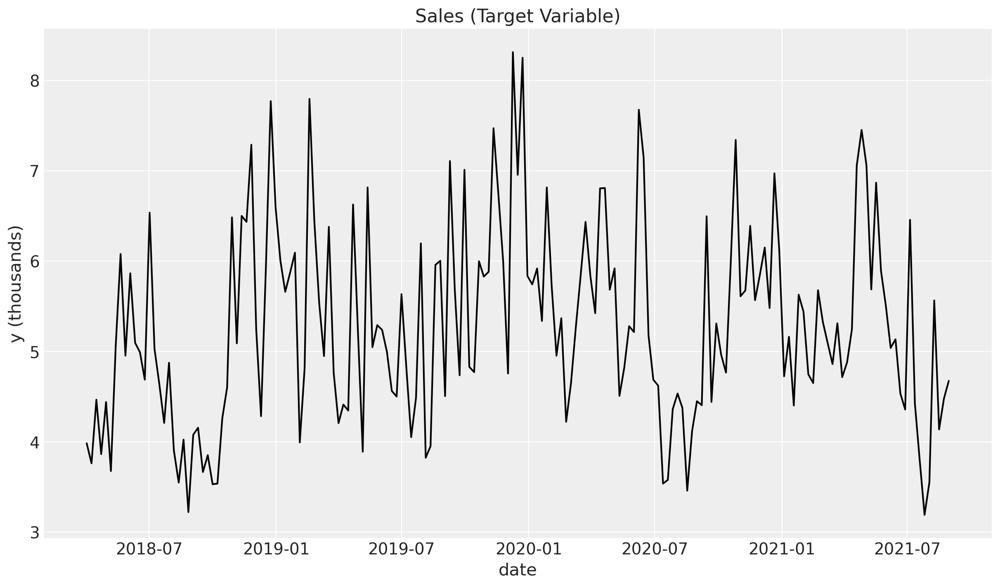

In [10]:
df["intercept"] = 2.0
df["epsilon"] = rng.normal(loc=0.0, scale=0.25, size=n)

amplitude = 1
beta_1 = 3.0
beta_2 = 2.0
betas = [beta_1, beta_2]


df["y"] = amplitude * (
    df["intercept"]
    + df["trend"]
    + df["seasonality"]
    + 1.5 * df["event_1"]
    + 2.5 * df["event_2"]
    + beta_1 * df["x1_adstock_saturated"]
    + beta_2 * df["x2_adstock_saturated"]
    + df["epsilon"]
)

fig, ax = plt.subplots()
sns.lineplot(x="date_week", y="y", color="black", data=df, ax=ax)
ax.set(title="Sales (Target Variable)", xlabel="date", ylabel="y (thousands)");

We can visualize the true component contributions over the historical period:

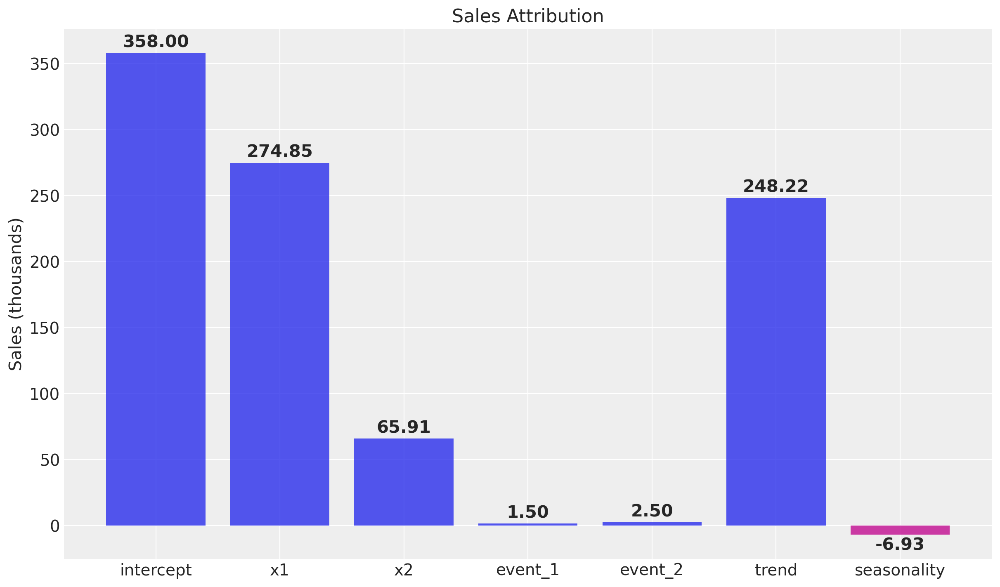

In [11]:
fig, ax = plt.subplots()

contributions = [
    df["intercept"].sum(),
    (beta_1 * df["x1_adstock_saturated"]).sum(),
    (beta_2 * df["x2_adstock_saturated"]).sum(),
    1.5 * df["event_1"].sum(),
    2.5 * df["event_2"].sum(),
    df["trend"].sum(),
    df["seasonality"].sum(),
]

ax.bar(
    ["intercept", "x1", "x2", "event_1", "event_2", "trend", "seasonality"],
    contributions,
    color=["C0" if x >= 0 else "C3" for x in contributions],
    alpha=0.8,
)
ax.bar_label(
    ax.containers[0],
    fmt="{:,.2f}",
    label_type="edge",
    padding=2,
    fontsize=15,
    fontweight="bold",
)
ax.set(title="Sales Attribution", ylabel="Sales (thousands)");

We would like to recover these values from the model.

### 6. Media Contribution Interpretation

From the data generating process we can compute the relative contribution of each channel to the target variable. We will recover these values back from the model.

In [12]:
contribution_share_x1: float = (beta_1 * df["x1_adstock_saturated"]).sum() / (
    beta_1 * df["x1_adstock_saturated"] + beta_2 * df["x2_adstock_saturated"]
).sum()

contribution_share_x2: float = (beta_2 * df["x2_adstock_saturated"]).sum() / (
    beta_1 * df["x1_adstock_saturated"] + beta_2 * df["x2_adstock_saturated"]
).sum()

print(f"Contribution Share of x1: {contribution_share_x1:.2f}")
print(f"Contribution Share of x2: {contribution_share_x2:.2f}")

Contribution Share of x1: 0.81
Contribution Share of x2: 0.19


We can obtain the contribution plots for each channel where we clearly see the effect of the adstock and saturation transformations.

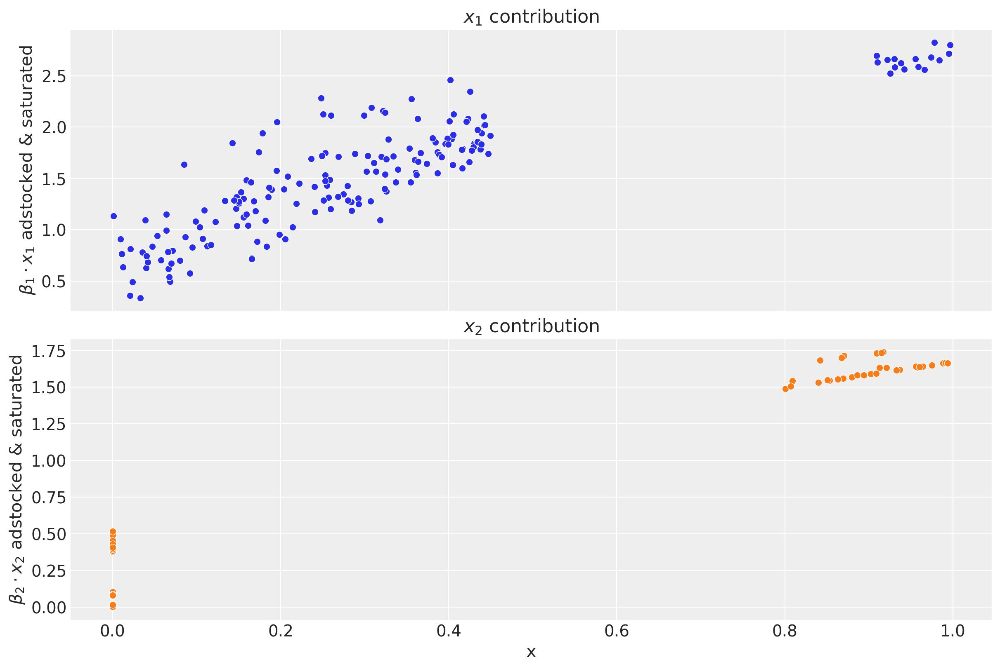

In [13]:
fig, ax = plt.subplots(
    nrows=2, ncols=1, figsize=(12, 8), sharex=True, sharey=False, layout="constrained"
)

for i, x in enumerate(["x1", "x2"]):
    sns.scatterplot(
        x=df[x],
        y=amplitude * betas[i] * df[f"{x}_adstock_saturated"],
        color=f"C{i}",
        ax=ax[i],
    )
    ax[i].set(
        title=f"$x_{i + 1}$ contribution",
        ylabel=f"$\\beta_{i + 1} \\cdot x_{i + 1}$ adstocked & saturated",
        xlabel="x",
    )

This plot shows some interesting aspects of the media contribution: 

- The adstock effect is reflected in the non-zero contribution of the channel even when the spend is zero.
- One clearly see the saturation effect as the contribution growth (slope) decreases as the spend increases.

As we will see in Part II of this notebook, we will recover these plots from the model!

We see that channel $x_{1}$ has a higher contribution than $x_{2}$. This could be explained by the fact that there was more spend in channel  $x_{1}$ than in channel $x_{2}$:

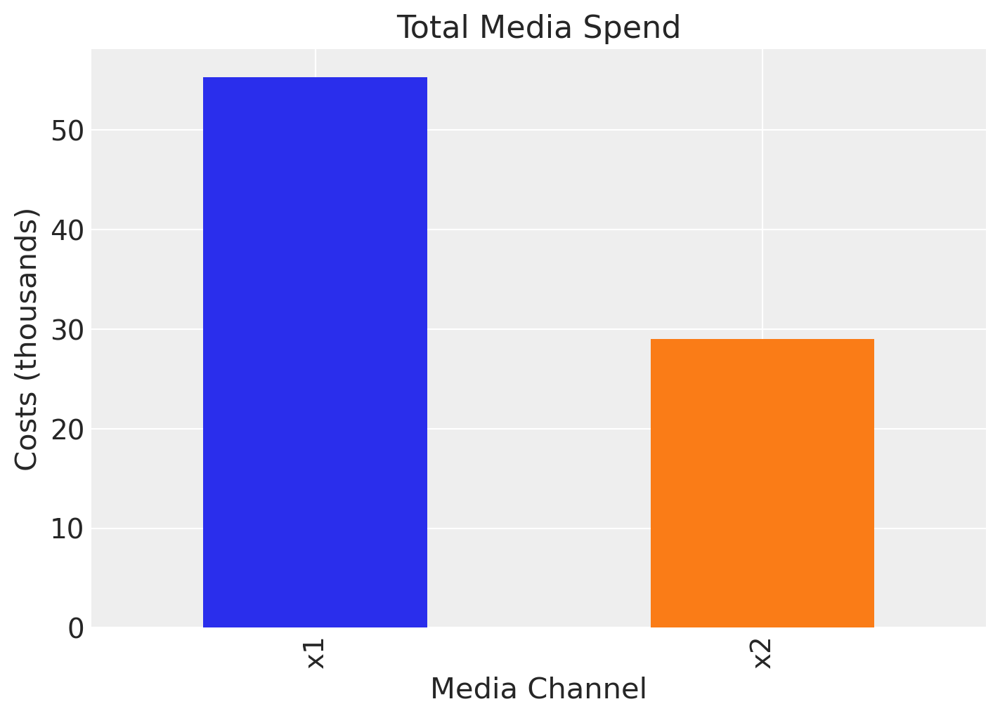

In [14]:
fig, ax = plt.subplots(figsize=(7, 5))
df[["x1", "x2"]].sum().plot(kind="bar", color=["C0", "C1"], ax=ax)
ax.set(title="Total Media Spend", xlabel="Media Channel", ylabel="Costs (thousands)");

However, one usually is not only interested in the contribution itself but rather the Return on Ad Spend (ROAS). That is, the contribution divided by the cost. We can compute the ROAS for each channel as follows:

In [15]:
roas_1 = (amplitude * beta_1 * df["x1_adstock_saturated"]).sum() / df["x1"].sum()
roas_2 = (amplitude * beta_2 * df["x2_adstock_saturated"]).sum() / df["x2"].sum()

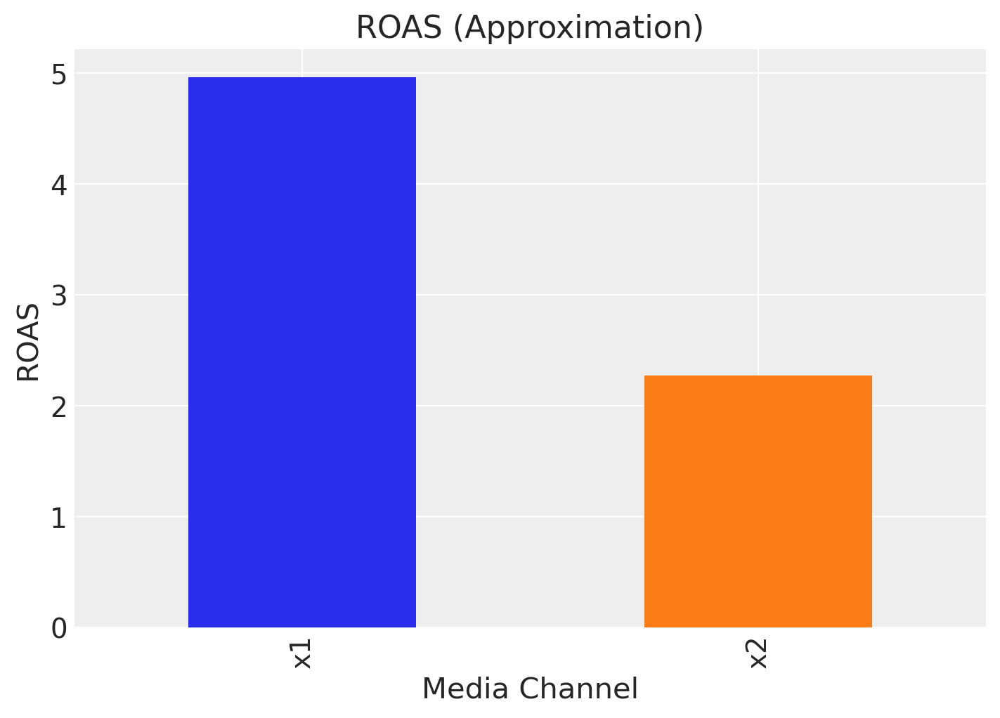

In [16]:
fig, ax = plt.subplots(figsize=(7, 5))
(
    pd.Series(data=[roas_1, roas_2], index=["x1", "x2"]).plot(
        kind="bar", color=["C0", "C1"]
    )
)

ax.set(title="ROAS (Approximation)", xlabel="Media Channel", ylabel="ROAS");

That is, channel $x_{1}$ seems to be more efficient than channel $x_{2}$.

```{note}
We recommended reading Section 4.1 in [Jin, Yuxue, et al. “Bayesian methods for media mix modeling with carryover and shape effects.” (2017)](https://research.google/pubs/pub46001/) for a detailed explanation of the ROAS (and mROAS). In particular:

- If we transform our target variable $y$ (e.g. with a log transformation), one needs to be careful with the ROAS computation as setting the spend to zero does not commute with the transformation.

- One has to be careful with the adstock effect so that we include a carryover period to fully account for the effect of the spend. The ROAS estimation above is an approximation.
```

### 7. Data Output

We of course will not have all of these features in our real data. Let's filter out the features we will use for modeling:

In [17]:
columns_to_keep = [
    "date_week",
    "y",
    "x1",
    "x2",
    "event_1",
    "event_2",
    "dayofyear",
]

data = df[columns_to_keep].copy()

data.head()

,date_week,y,x1,x2,event_1,event_2,dayofyear
0,2018-04-02,3.984662,0.318580,0.0,0.0,0.0,92
1,2018-04-09,3.762872,0.112388,0.0,0.0,0.0,99
2,2018-04-16,4.466967,0.292400,0.0,0.0,0.0,106
3,2018-04-23,3.864219,0.071399,0.0,0.0,0.0,113
4,2018-04-30,4.441625,0.386745,0.0,0.0,0.0,120


## Part II: Modeling

On this second part, we focus on the modeling process. We will use the data generated in Part I.

## 1. Feature Engineering

Assuming we did an EDA and we have a good understanding of the data (we did not do it here as we generated the data ourselves, but please never skip the EDA!), we can start building our model. One thing we immediately see is the seasonality and the trend component. We can generate features ourselves as *control variables*, for example using a uniformly increasing straight line to model the trend component. In addition, we include *dummy variables* to encode the `event_1`  and `event_2` contributions.

For the seasonality component we use Fourier modes (similar as in [Prophet](https://facebook.github.io/prophet/)). We do not need to add the Fourier modes by hand as they are handled by the model API through the `yearly_seasonality` argument (see below). We use 4 modes for the seasonality component.

In [18]:
# trend feature
data["t"] = range(n)

data.head()

,date_week,y,x1,x2,event_1,event_2,dayofyear,t
0,2018-04-02,3.984662,0.318580,0.0,0.0,0.0,92,0
1,2018-04-09,3.762872,0.112388,0.0,0.0,0.0,99,1
2,2018-04-16,4.466967,0.292400,0.0,0.0,0.0,106,2
3,2018-04-23,3.864219,0.071399,0.0,0.0,0.0,113,3
4,2018-04-30,4.441625,0.386745,0.0,0.0,0.0,120,4


## 2. Model Specification

We can specify the model structure using the {class}`MMM <pymc_marketing.mmm.mmm.MMM>` class. This class, handles a lot of internal boilerplate code for us such us scaling the data (see details below) and handy diagnostics and reporting plots. One great feature is that we can specify the channel priors distributions ourselves, which fundamental component of the [bayesian workflow](https://arxiv.org/abs/2011.01808) as we can incorporate our prior knowledge into the model. This is one of the most important advantages of using a bayesian approach. Let's see how we can do it.

As we do not know much more about the channels, we start with a simple heuristic: 

1. The channel contributions should be positive, so we can for example use a {class}`HalfNormal <pymc.distributions.continuous.HalfNormal>` distribution as prior. We need to set the `sigma` parameter per channel. The higher the `sigma`, the more "freedom" it has to fit the data. To specify `sigma` we can use the following point.

2. We expect channels where we spend the most to have more attributed sales , before seeing the data. This is a very reasonable assumption (note that we are not imposing anything at the level of efficiency!).

How to incorporate this heuristic into the model? To begin with, it is important to note that the {class}`MMM <pymc_marketing.mmm.mmm.MMM>` class scales the target and input variables through an [`MaxAbsScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MaxAbsScaler.html) transformer from [`scikit-learn`](https://scikit-learn.org/stable/), its important to specify the priors in the scaled space (i.e. between 0 and 1). One way to do it is to use the spend share as the `sigma` parameter for the `HalfNormal` distribution. We can actually add a scaling factor to take into account the support of the distribution.

First, let's compute the share of spend per channel:

In [19]:
total_spend_per_channel = data[["x1", "x2"]].sum(axis=0)

spend_share = total_spend_per_channel / total_spend_per_channel.sum()

spend_share

x1    0.65632
x2    0.34368
dtype: float64

Next, we specify the `sigma` parameter per channel: 

In [20]:
n_channels = 2

prior_sigma = n_channels * spend_share.to_numpy()

prior_sigma.tolist()

Delayed Saturated MMM follows sklearn convention, so we need to split our data into X (predictors) and y(target value)

In [21]:
X = data.drop("y", axis=1)
y = data["y"]

In [22]:
# X.to_csv("files/x_data.csv")
# y.to_csv("files/y_data.csv")

You can use the optional parameter 'model_config' to apply your own priors to the model. Each entry in the 'model_config' contains a key that corresponds to a registered distribution name in our model. The value of the key is a dictionary that describes the input parameters of that specific distribution.

If you're unsure how to define your own priors, you can use the 'default_model_config' property of {class}`MMM <pymc_marketing.mmm.mmm.MMM>` to see the required structure.

In [23]:
dummy_model = MMM(
    date_column="",
    channel_columns=[""],
    target_column="y",
    adstock=GeometricAdstock(l_max=4),
    saturation=LogisticSaturation(),
)
dummy_model.default_model_config

{'intercept': Prior("Normal", mu=0, sigma=2),
 'likelihood': Prior("Normal", sigma=Prior("HalfNormal", sigma=2)),
 'gamma_control': Prior("Normal", mu=0, sigma=2, dims="control"),
 'gamma_fourier': Prior("Laplace", mu=0, b=1, dims="fourier_mode"),
 'adstock_alpha': Prior("Beta", alpha=1, beta=3),
 'saturation_lam': Prior("Gamma", alpha=3, beta=1),
 'saturation_beta': Prior("HalfNormal", sigma=2)}

You can change only the prior parameters that you wish, no need to alter all of them, unless you'd like to!

In [24]:
my_model_config = {
    "intercept": Prior("Normal", mu=0.5, sigma=0.2),
    "saturation_beta": Prior("HalfNormal", sigma=prior_sigma),
    "gamma_control": Prior("Normal", mu=0, sigma=0.05),
    "gamma_fourier": Prior("Laplace", mu=0, b=0.2),
    "likelihood": Prior("Normal", sigma=Prior("HalfNormal", sigma=6)),
}

**Remark:** For the prior specification there is no right or wrong answer. It all depends on the data, the context and the assumptions you are willing to make. It is always recommended to do some prior predictive sampling and sensitivity analysis to check the impact of the priors on the posterior. We skip this here for the sake of simplicity. If you are not sure about specific priors, the {class}`MMM <pymc_marketing.mmm.mmm.MMM>` class has some default priors that you can use as a starting point.

Model sampler allows specifying set of parameters that will be passed to fit the same way as the `kwargs` are getting passed so far. It doesn't disable the fit kwargs, but rather extend them, to enable customizable and preservable configuration. By default the sampler_config for {class}`MMM <pymc_marketing.mmm.mmm.MMM>` is empty. But if you'd like to use it, you can define it like showed below: 

In [25]:
my_sampler_config = {"progressbar": True}

Now we are ready to use the {class}`MMM <pymc_marketing.mmm.mmm.MMM>` class to define the model.

In [26]:
from pymc_marketing.mmm.builders.yaml import build_mmm_from_yaml

/var/folders/f0/rbz8xs8s17n3k3f_ccp31bvh0000gn/T/ipykernel_55428/3872514727.py:1: UserWarning: The pymc_marketing.mmm.builders module is experimental and its API may change without warning.
  from pymc_marketing.mmm.builders.yaml import build_mmm_from_yaml


In [99]:
mmm = build_mmm_from_yaml(config_path="files/builder.yml")

# MMM(
#     # model_config=my_model_config,
#     # sampler_config=my_sampler_config,
#     date_column="date_week",
#     target_column="y",
#     adstock=GeometricAdstock(l_max=8),
#     saturation=LogisticSaturation(),
#     channel_columns=["x1", "x2"],
#     control_columns=["event_1", "event_2", "t"],
#     yearly_seasonality=2,
# )

# mmm.build_model(X, y)

Observe how the media transformations were handled by the class `MMM`.

To assess the model prior parameters we can look into the prior predictive plot:

In [51]:
import pymc as pm

In [52]:
with mmm.model:
    prior = pm.sample_prior_predictive()
prior

Sampling: [adstock_alpha, delta, delta_b, gamma_control, gamma_fourier, gamma_fourier_b, intercept_contribution, saturation_beta, saturation_lam, y, y_sigma, y_sigma_sigma]


Inference data with groups:
	> prior
	> prior_predictive
	> observed_data
	> constant_data

The prior predictive plot shows that the priors are not too informative.

## 3. Model Fitting

We can now fit the model:

```{tip}
You can use other NUTS samplers to fit the model as one can do with PyMC models. You just need to make sure to have the packages installed in your local environment. See {ref}`other_nuts_samplers`.
```

In [53]:
mmm.fit(X=X, y=y, chains=4, target_accept=0.85, random_seed=rng)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept_contribution, adstock_alpha, saturation_lam, saturation_beta, gamma_control, gamma_fourier_b, gamma_fourier, delta_b, delta, y_sigma_sigma, y_sigma]


/opt/anaconda3/envs/pymc-marketing-dev/lib/python3.12/site-packages/rich/live.py:256: UserWarning:

install "ipywidgets" for Jupyter support

Sampling 4 chains for 800 tune and 400 draw iterations (3_200 + 1_600 draws total) took 11 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details


/opt/anaconda3/envs/pymc-marketing-dev/lib/python3.12/site-packages/rich/live.py:256: UserWarning:

install "ipywidgets" for Jupyter support

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data
	> constant_data
	> fit_data

In [ ]:
# mmm.save("files/posterior.nc")

You can access `pymc` model as `mmm.model`.

In [31]:
type(mmm.model)

pymc.model.core.Model

In [32]:
print(f"Model was train using the {mmm.saturation.__class__.__name__} function")
print(f"and the {mmm.adstock.__class__.__name__} function")

Model was train using the LogisticSaturation function
and the GeometricAdstock function


We can easily see the explicit model structure:

In [107]:
type(mmm.graphviz())

graphviz.graphs.Digraph

> Note: You may notice that the graph here is an explicit version of our initial drawing (DAG), where we can now explicitly see all the different components that were included in each node, including their dimensionality. This graph is another way of looking at the same causal assumptions, made during the construction of the bayesian generative model.

## 4. Model Diagnostics

A good place to start is by looking if the model had any divergences:

In [34]:
# Number of diverging samples
mmm.idata["sample_stats"]["diverging"].sum().item()

We got none! 🙌

The {func}`fit_result <pymc_marketing.mmm.mmm.MMM.fit_result>` attribute contains the `pymc` trace object.

In [35]:
mmm.fit_result

<xarray.Dataset> Size: 30MB
Dimensions:                                  (chain: 4, draw: 400, channel: 2,
                                              control: 2, fourier_mode: 4,
                                              changepoint: 5, date: 179)
Coordinates:
  * chain                                    (chain) int64 32B 0 1 2 3
  * draw                                     (draw) int64 3kB 0 1 2 ... 398 399
  * channel                                  (channel) <U2 16B 'x1' 'x2'
  * control                                  (control) <U7 56B 'event_1' 'eve...
  * fourier_mode                             (fourier_mode) <U5 80B 'sin_1' ....
  * changepoint                              (changepoint) int64 40B 0 1 2 3 4
  * date                                     (date) datetime64[ns] 1kB 2018-0...
Data variables: (12/20)
    intercept_contribution                   (chain, draw) float64 13kB 0.356...
    adstock_alpha                            (chain, draw, channel) float64 26kB ...
    saturation_lam                           (chain, draw, channel) float64 26kB ...
    saturation_beta                          (chain, draw, channel) float64 26kB ...
    gamma_control                            (chain, draw, control) float64 26kB ...
    gamma_fourier_b                          (chain, draw) float64 13kB 0.029...
    ...                                       ...
    fourier_contribution                     (chain, draw, date, fourier_mode) float64 9MB ...
    yearly_seasonality_contribution          (chain, draw, date) float64 2MB ...
    trend_effect_contribution                (chain, draw, date) float64 2MB ...
    channel_contribution_original_scale      (chain, draw, date, channel) float64 5MB ...
    intercept_contribution_original_scale    (chain, draw) float64 13kB 2.962...
    y_original_scale                         (chain, draw, date) float64 2MB ...
Attributes:
    created_at:                 2025-10-26T13:34:52.757107+00:00
    arviz_version:              0.22.0
    inference_library:          pymc
    inference_library_version:  5.25.1
    sampling_time:              10.864428043365479
    tuning_steps:               800
    pymc_marketing_version:     0.17.0

We can therefore use all the `pymc` machinery to run model diagnostics. First, let's see the summary of the trace:

In [108]:
mmm.fit_result

<xarray.Dataset> Size: 39MB
Dimensions:                                         (chain: 4, draw: 400,
                                                     channel: 2, control: 2,
                                                     fourier_mode: 4,
                                                     changepoint: 5, date: 179)
Coordinates:
  * chain                                           (chain) int64 32B 0 1 2 3
  * draw                                            (draw) int64 3kB 0 1 ... 399
  * channel                                         (channel) <U2 16B 'x1' 'x2'
  * control                                         (control) <U7 56B 'event_...
  * fourier_mode                                    (fourier_mode) <U5 80B 's...
  * changepoint                                     (changepoint) int64 40B 0...
  * date                                            (date) datetime64[ns] 1kB ...
Data variables: (12/23)
    intercept_contribution                          (chain, draw) float64 13kB ...
    adstock_alpha                                   (chain, draw, channel) float64 26kB ...
    saturation_lam                                  (chain, draw, channel) float64 26kB ...
    saturation_beta                                 (chain, draw, channel) float64 26kB ...
    gamma_control                                   (chain, draw, control) float64 26kB ...
    gamma_fourier_b                                 (chain, draw) float64 13kB ...
    ...                                              ...
    channel_contribution_original_scale             (chain, draw, date, channel) float64 5MB ...
    intercept_contribution_original_scale           (chain, draw) float64 13kB ...
    control_contribution_original_scale             (chain, draw, date, control) float64 5MB ...
    trend_effect_contribution_original_scale        (chain, draw, date) float64 2MB ...
    yearly_seasonality_contribution_original_scale  (chain, draw, date) float64 2MB ...
    y_original_scale                                (chain, draw, date) float64 2MB ...
Attributes:
    created_at:                 2025-10-26T13:48:30.178705+00:00
    arviz_version:              0.22.0
    inference_library:          pymc
    inference_library_version:  5.25.1
    sampling_time:              10.958279132843018
    tuning_steps:               800
    pymc_marketing_version:     0.17.0

In [36]:
az.summary(
    data=mmm.fit_result,
    var_names=[
        "intercept_contribution",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept_contribution,0.348,0.014,0.320,0.371,0.000,0.000,1290.0,1026.0,1.01
y_sigma,0.030,0.002,0.027,0.033,0.000,0.000,1756.0,1096.0,1.00
saturation_beta[x1],0.359,0.018,0.323,0.390,0.001,0.001,1055.0,921.0,1.00
saturation_beta[x2],0.273,0.053,0.196,0.370,0.002,0.002,729.0,1032.0,1.00
saturation_lam[x1],4.018,0.368,3.334,4.708,0.010,0.008,1418.0,1274.0,1.00
saturation_lam[x2],2.882,1.035,1.302,4.722,0.040,0.054,717.0,816.0,1.00
adstock_alpha[x1],0.392,0.030,0.340,0.454,0.001,0.001,1372.0,1239.0,1.00
adstock_alpha[x2],0.197,0.037,0.121,0.263,0.001,0.001,925.0,691.0,1.00
gamma_control[event_1],0.242,0.031,0.179,0.297,0.001,0.001,1603.0,1042.0,1.00
gamma_control[event_2],0.326,0.029,0.270,0.377,0.001,0.001,1975.0,1047.0,1.00


Observe that the estimated parameters for $\alpha$ and $\lambda$ are very close to the ones we set in the data generation process! Let's plot the trace for the parameters:

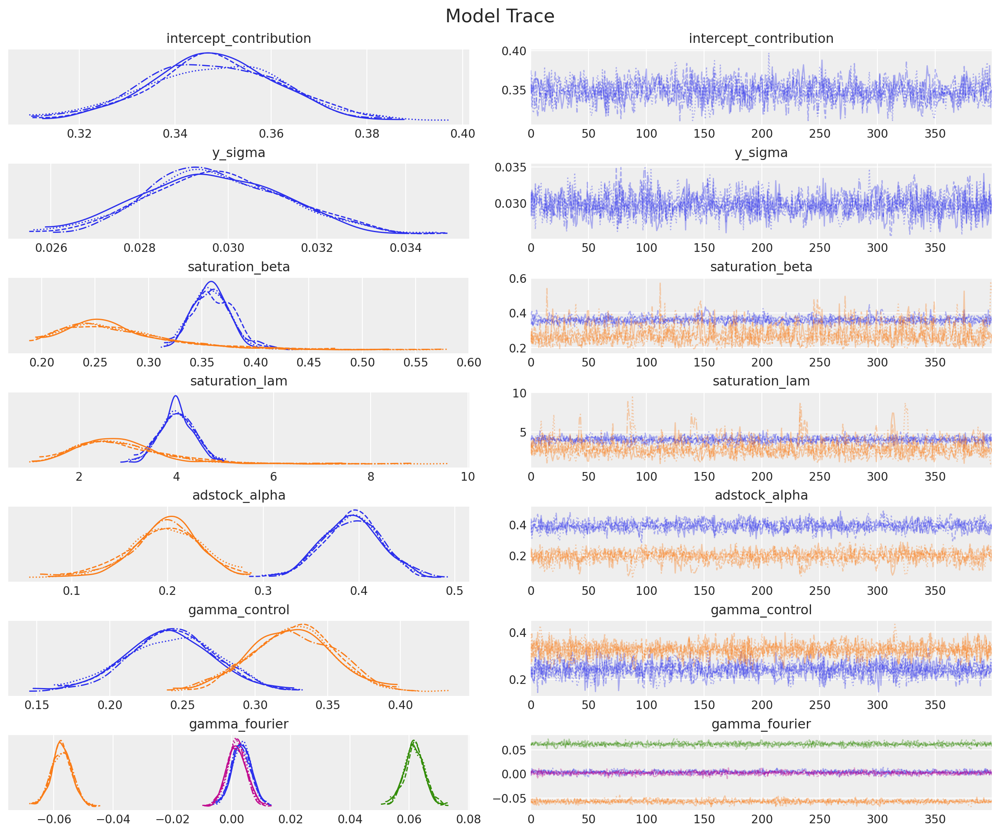

In [37]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept_contribution",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

Now we sample from the posterior predictive distribution:

In [101]:
mmm.sample_posterior_predictive(X, extend_idata=True, combined=True)

Sampling: [y]


/opt/anaconda3/envs/pymc-marketing-dev/lib/python3.12/site-packages/rich/live.py:256: UserWarning:

install "ipywidgets" for Jupyter support

<xarray.Dataset> Size: 5MB
Dimensions:           (date: 179, sample: 1600)
Coordinates:
  * date              (date) datetime64[ns] 1kB 2018-04-02 ... 2021-08-30
  * sample            (sample) object 13kB MultiIndex
  * chain             (sample) int64 13kB 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
  * draw              (sample) int64 13kB 0 1 2 3 4 5 ... 395 396 397 398 399
Data variables:
    y                 (date, sample) float64 2MB 0.4818 0.505 ... 0.6283 0.606
    y_original_scale  (date, sample) float64 2MB 4.005 4.198 ... 5.223 5.037
Attributes:
    created_at:                 2025-10-26T15:02:40.025284+00:00
    arviz_version:              0.22.0
    inference_library:          pymc
    inference_library_version:  5.25.1

We can now plot the posterior predictive distribution for the target variable. By default, the `plot_posterior_predictive` method will plot the mean prediction along with a 94% and 50% HDI.

# Plotly plots

In [104]:
import plotly.graph_objects as go

# import arviz as az

# Your existing code
y_pred = mmm.idata.posterior_predictive.y_original_scale

# Calculate HDI intervals
hdi_94 = az.hdi(y_pred, hdi_prob=0.94)
hdi_50 = az.hdi(y_pred, hdi_prob=0.50)

# Calculate mean prediction
y_mean = y_pred.mean(dim=["chain", "draw"])

# Get dates from your data
dates = hdi_94.date.values  # or however you're getting dates

# Create the figure
fig = go.Figure()

# Add HDI 94% band - ACCESS THE "y" DATA VARIABLE FIRST
fig.add_trace(
    go.Scatter(
        x=dates,
        y=hdi_94["y_original_scale"].sel(hdi="higher").values,  # ← FIX: Add ["y"] here
        mode="lines",
        line=dict(width=0),
        showlegend=False,
        name="HDI 94% upper",
    )
)

fig.add_trace(
    go.Scatter(
        x=dates,
        y=hdi_94["y_original_scale"].sel(hdi="lower").values,  # ← FIX: Add ["y"] here
        mode="lines",
        line=dict(width=0),
        fill="tonexty",
        fillcolor="rgba(0, 100, 80, 0.2)",
        showlegend=True,
        name="HDI 94%",
    )
)

# Add HDI 50% band
fig.add_trace(
    go.Scatter(
        x=dates,
        y=hdi_50["y_original_scale"].sel(hdi="higher").values,  # ← FIX: Add ["y"] here
        mode="lines",
        line=dict(width=0),
        showlegend=False,
        name="HDI 50% upper",
    )
)

fig.add_trace(
    go.Scatter(
        x=dates,
        y=hdi_50["y_original_scale"].sel(hdi="lower").values,  # ← FIX: Add ["y"] here
        mode="lines",
        line=dict(width=0),
        fill="tonexty",
        fillcolor="rgba(0, 100, 80, 0.4)",
        showlegend=True,
        name="HDI 50%",
    )
)

# Add the mean line
fig.add_trace(
    go.Scatter(
        x=dates,
        y=y_mean.values,
        mode="lines",
        line=dict(color="rgb(0, 100, 80)", width=2),
        name="Mean",
    )
)

# Optionally add observed data if you have it
fig.add_trace(
    go.Scatter(
        x=dates,
        y=y,
        mode="markers",
        marker=dict(color="black", size=4),
        name="Observed",
    )
)

# Update layout
fig.update_layout(
    title="Posterior Predictive Plot",
    xaxis_title="Date",
    yaxis_title="Sales",
    template="plotly_white",
    hovermode="x unified",
)

fig.show()

In [62]:
# import plotly.graph_objects as go
# import arviz as az
# import numpy as np

# Extract the contribution variables (these are from posterior, not posterior_predictive)
channel_contrib = mmm.idata.posterior.channel_contribution_original_scale.sum(
    dim="channel"
)
control_contrib = mmm.idata.posterior.control_contribution_original_scale.sum(
    dim="control"
)
trend_contrib = mmm.idata.posterior.trend_effect_contribution_original_scale
seasonality_contrib = mmm.idata.posterior.yearly_seasonality_contribution_original_scale

# Store in a dictionary for easier iteration
contributions = {
    "Channel Effects": channel_contrib,
    "Control Variables": control_contrib,
    "Trend Effect": trend_contrib,
    "Yearly Seasonality": seasonality_contrib,
}

# Define colors for each contribution type
colors = {
    "Channel Effects": "rgb(31, 119, 180)",  # blue
    "Control Variables": "rgb(255, 127, 14)",  # orange
    "Trend Effect": "rgb(44, 160, 44)",  # green
    "Yearly Seasonality": "rgb(214, 39, 40)",  # red
}

# Create figure
fig = go.Figure()

# Get dates (assuming they're in the date dimension)
dates = channel_contrib.date.values

# Add traces for each variable
for var_name, var_data in contributions.items():
    # Calculate HDI intervals
    hdi_94 = az.hdi(var_data, hdi_prob=0.94)

    # Calculate mean
    var_mean = var_data.mean(dim=["chain", "draw"])

    # Get the variable name from the dataset (it should be the data variable name)
    data_var_name = list(hdi_94.data_vars)[0]

    # Extract HDI bounds
    hdi_upper = hdi_94[data_var_name].sel(hdi="higher").values
    hdi_lower = hdi_94[data_var_name].sel(hdi="lower").values

    # Add HDI band (filled area)
    fig.add_trace(
        go.Scatter(
            x=np.concatenate([dates, dates[::-1]]),  # x, then x reversed
            y=np.concatenate(
                [hdi_upper, hdi_lower[::-1]]
            ),  # upper, then lower reversed
            fill="toself",
            fillcolor=colors[var_name].replace("rgb", "rgba").replace(")", ", 0.2)"),
            line=dict(color="rgba(255,255,255,0)"),
            hoverinfo="skip",
            showlegend=False,
            name=f"{var_name} 94% HDI",
        )
    )

    # Add mean line
    fig.add_trace(
        go.Scatter(
            x=dates,
            y=var_mean.values,
            mode="lines",
            line=dict(color=colors[var_name], width=2),
            name=var_name,
        )
    )

# Update layout
fig.update_layout(
    title="Model Contributions Over Time (Original Scale) with 94% HDI",
    xaxis_title="Date",
    yaxis_title="Contribution",
    template="plotly_white",
    hovermode="x unified",
    height=600,
    legend=dict(orientation="v", yanchor="top", y=0.99, xanchor="left", x=0.01),
)

fig.show()

In [67]:
from plotly.subplots import make_subplots

# import plotly.graph_objects as go
# import arviz as az
# import numpy as np

# Extract the channel contributions
channel_contributions = mmm.idata.posterior.channel_contribution_original_scale
channels = channel_contributions.channel.values
dates = channel_contributions.date.values

# Calculate number of rows for subplots (one on top of the other)
n_channels = len(channels)
n_cols = 1  # Single column layout
n_rows = n_channels  # One row per channel

# Create subplots
fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    subplot_titles=[f"{channel}" for channel in channels],
    vertical_spacing=0.2,
    horizontal_spacing=0.10,
)

# Color palette
color_palette = [
    "rgb(31, 119, 180)",
    "rgb(255, 127, 14)",
    "rgb(44, 160, 44)",
    "rgb(214, 39, 40)",
    "rgb(148, 103, 189)",
    "rgb(140, 86, 75)",
]

# Add traces for each channel
for idx, channel in enumerate(channels):
    row = idx + 1
    col = 1

    # Select channel data
    channel_data = channel_contributions.sel(channel=channel)

    # Calculate HDI and mean
    hdi_94 = az.hdi(channel_data, hdi_prob=0.94)
    mean_contribution = channel_data.mean(dim=["chain", "draw"])

    # Get data variable name
    data_var_name = list(hdi_94.data_vars)[0]

    # Extract values
    hdi_upper = hdi_94[data_var_name].sel(hdi="higher").values
    hdi_lower = hdi_94[data_var_name].sel(hdi="lower").values

    # Choose color
    color = color_palette[idx % len(color_palette)]
    fill_color = color.replace("rgb", "rgba").replace(")", ", 0.2)")

    # Add HDI band
    fig.add_trace(
        go.Scatter(
            x=np.concatenate([dates, dates[::-1]]),
            y=np.concatenate([hdi_upper, hdi_lower[::-1]]),
            fill="toself",
            fillcolor=fill_color,
            line=dict(color="rgba(255,255,255,0)"),
            showlegend=False,
            hoverinfo="skip",
        ),
        row=row,
        col=col,
    )

    # Add mean line
    fig.add_trace(
        go.Scatter(
            x=dates,
            y=mean_contribution.values,
            mode="lines",
            line=dict(color=color, width=2),
            showlegend=False,
        ),
        row=row,
        col=col,
    )

# Update layout
fig.update_layout(
    title_text="Channel Contributions Over Time (Original Scale) with 94% HDI",
    template="plotly_white",
    height=300 * n_rows,
    showlegend=False,
)

# Update x and y axis labels
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Contribution")

fig.show()

In [ ]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import arviz as az
# import numpy as np

# Calculate total ROAS (sum of contributions / sum of inputs)
roas_samples = mmm.idata.posterior.channel_contribution_original_scale.sum(
    dim="date"
) / mmm.idata.constant_data.channel_data.sum(dim="date")

# Get channels
channels = roas_samples.channel.values

# Create subplots
n_channels = len(channels)
fig = make_subplots(
    rows=n_channels,
    cols=1,
    subplot_titles=[f"Channel: {channel}" for channel in channels],
    vertical_spacing=0.15,
)

# Color palette
color_palette = [
    "rgba(31, 119, 180, 0.7)",
    "rgba(255, 127, 14, 0.7)",
    "rgba(44, 160, 44, 0.7)",
    "rgba(214, 39, 40, 0.7)",
]

# Create distribution plot for each channel
for idx, channel in enumerate(channels):
    # Get ROAS samples for this channel
    channel_roas = roas_samples.sel(channel=channel)

    # Flatten the samples (chain, draw dimensions)
    samples = channel_roas.values.flatten()

    # Calculate HDI
    hdi_94 = az.hdi(channel_roas, hdi_prob=0.94)
    data_var_name = list(hdi_94.data_vars)[0]
    hdi_lower = float(hdi_94[data_var_name].sel(hdi="lower").values)
    hdi_upper = float(hdi_94[data_var_name].sel(hdi="higher").values)

    # Calculate mean
    mean_roas = float(samples.mean())

    # Create histogram
    fig.add_trace(
        go.Histogram(
            x=samples,
            name=channel,
            marker_color=color_palette[idx % len(color_palette)],
            opacity=0.7,
            nbinsx=50,
            histnorm="probability density",
            showlegend=False,
        ),
        row=idx + 1,
        col=1,
    )

    # Add vertical lines for mean and HDI
    y_max = 1  # Will be scaled by plotly automatically

    # Mean line
    fig.add_trace(
        go.Scatter(
            x=[mean_roas, mean_roas],
            y=[0, y_max],
            mode="lines",
            line=dict(color="black", width=2, dash="dash"),
            name="Mean",
            showlegend=(idx == 0),
            hovertemplate=f"Mean: {mean_roas:.4f}<extra></extra>",
        ),
        row=idx + 1,
        col=1,
    )

    # HDI lines
    for hdi_val, name in [(hdi_lower, "HDI Lower"), (hdi_upper, "HDI Upper")]:
        fig.add_trace(
            go.Scatter(
                x=[hdi_val, hdi_val],
                y=[0, y_max],
                mode="lines",
                line=dict(color="red", width=1.5),
                name="94% HDI" if idx == 0 and name == "HDI Lower" else None,
                showlegend=(idx == 0 and name == "HDI Lower"),
                hovertemplate=f"{name}: {hdi_val:.4f}<extra></extra>",
            ),
            row=idx + 1,
            col=1,
        )

    # Update x-axis label for bottom plot
    if idx == n_channels - 1:
        fig.update_xaxes(
            title_text="ROAS (Total Response / Total Input)", row=idx + 1, col=1
        )

# Update layout
fig.update_layout(
    title_text="Return on input Posterior Distributions",
    template="plotly_white",
    height=400 * n_channels,
    showlegend=True,
)

fig.update_yaxes(title_text="Density")

fig.show()

In [83]:
# from plotly.subplots import make_subplots
# import plotly.graph_objects as go
# import arviz as az
# import numpy as np

curve = mmm.saturation.sample_curve(
    mmm.idata.posterior[["saturation_beta", "saturation_lam"]], max_value=2
)

channels = curve.channel.values
n_channels = len(channels)
n_cols = 2
n_rows = int(np.ceil(n_channels / n_cols))

# Create subplots
fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    subplot_titles=[f"{channel}" for channel in channels],
    vertical_spacing=0.15,
    horizontal_spacing=0.12,
)

color_palette = [
    "rgb(31, 119, 180)",
    "rgb(255, 127, 14)",
    "rgb(44, 160, 44)",
    "rgb(214, 39, 40)",
]

for idx, channel in enumerate(channels):
    row = idx // n_cols + 1
    col = idx % n_cols + 1

    # Select and scale - ADD .rename() HERE
    curve_channel = curve.sel(channel=channel)
    curve_original_scale = (
        curve_channel * mmm.idata.constant_data.target_scale
    ).rename("saturation_curve")
    channel_scale = mmm.idata.constant_data.channel_scale.sel(channel=channel)
    x_original = curve_channel.coords["x"].values * float(channel_scale.values)

    # Calculate statistics
    curve_mean = curve_original_scale.mean(dim=["chain", "draw"])
    hdi_94 = az.hdi(curve_original_scale, hdi_prob=0.94)

    data_var_name = list(hdi_94.data_vars)[0]
    hdi_upper = hdi_94[data_var_name].sel(hdi="higher").values
    hdi_lower = hdi_94[data_var_name].sel(hdi="lower").values

    color = color_palette[idx % len(color_palette)]
    fill_color = color.replace("rgb", "rgba").replace(")", ", 0.2)")

    # HDI band
    fig.add_trace(
        go.Scatter(
            x=np.concatenate([x_original, x_original[::-1]]),
            y=np.concatenate([hdi_upper, hdi_lower[::-1]]),
            fill="toself",
            fillcolor=fill_color,
            line=dict(color="rgba(255,255,255,0)"),
            showlegend=False,
            hoverinfo="skip",
        ),
        row=row,
        col=col,
    )

    # Mean curve
    fig.add_trace(
        go.Scatter(
            x=x_original,
            y=curve_mean.values,
            mode="lines",
            line=dict(color=color, width=2),
            showlegend=False,
        ),
        row=row,
        col=col,
    )

    # Scatter points
    channel_data = mmm.idata.constant_data.channel_data.sel(channel=channel)
    channel_contrib = mmm.idata.posterior.channel_contribution_original_scale.sel(
        channel=channel
    ).mean(dim=["chain", "draw"])

    fig.add_trace(
        go.Scatter(
            x=channel_data.values,
            y=channel_contrib.values,
            mode="markers",
            marker=dict(color=color, size=4, opacity=0.6),
            showlegend=False,
        ),
        row=row,
        col=col,
    )

fig.update_layout(
    title_text="Saturation Curves (Original Scale) with 94% HDI",
    template="plotly_white",
    height=400 * n_rows,
    showlegend=False,
)

fig.update_xaxes(title_text="Channel Input")
fig.update_yaxes(title_text="Contribution")

fig.show()

Sampling: []


/opt/anaconda3/envs/pymc-marketing-dev/lib/python3.12/site-packages/rich/live.py:256: UserWarning:

install "ipywidgets" for Jupyter support

In [106]:
import arviz as az
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats


def plot_trace_plotly(idata, var_names=None, figsize=(1200, 800)):
    """
    Replicate ArviZ's plot_trace using Plotly.

    Parameters
    ----------
    idata : arviz.InferenceData
        The inference data object containing posterior samples
    var_names : list of str, optional
        List of variable names to plot. If None, plots all variables.
    figsize : tuple
        Figure size as (width, height) in pixels

    Returns
    -------
    fig : plotly.graph_objects.Figure
        The Plotly figure object
    """
    # Get posterior group
    posterior = idata.posterior

    # Get variable names if not provided
    if var_names is None:
        var_names = list(posterior.data_vars)

    # Filter variables and flatten multi-dimensional variables
    plot_vars = []
    for var in var_names:
        var_data = posterior[var]
        # Handle multi-dimensional variables
        if var_data.ndim == 2:  # Only chain and draw dimensions
            plot_vars.append((var, None))
        else:  # Has additional dimensions
            # Flatten additional dimensions
            coords = {
                dim: var_data[dim].values
                for dim in var_data.dims
                if dim not in ["chain", "draw"]
            }
            if coords:
                # Create all combinations of coordinates
                import itertools

                coord_names = list(coords.keys())
                coord_values = [coords[name] for name in coord_names]
                for combo in itertools.product(*coord_values):
                    selector = dict(zip(coord_names, combo))
                    label = f"{var}[{','.join(str(c) for c in combo)}]"
                    plot_vars.append((var, selector, label))
            else:
                plot_vars.append((var, None, var))

    n_vars = len(plot_vars)

    # Create subplots: 2 columns (distribution, trace), n_vars rows
    subplot_titles = []
    for item in plot_vars:
        var_label = item[2] if len(item) > 2 else item[0]
        subplot_titles.extend([f"{var_label} - Distribution", f"{var_label} - Trace"])

    fig = make_subplots(
        rows=n_vars,
        cols=2,
        subplot_titles=subplot_titles,
        horizontal_spacing=0.1,
        vertical_spacing=0.05 if n_vars > 1 else 0.1,
    )

    # Color palette for chains
    colors = [
        "#1f77b4",
        "#ff7f0e",
        "#2ca02c",
        "#d62728",
        "#9467bd",
        "#8c564b",
        "#e377c2",
        "#7f7f7f",
        "#bcbd22",
        "#17becf",
    ]

    for idx, item in enumerate(plot_vars):
        var = item[0]
        selector = item[1] if len(item) > 1 else None
        var_label = item[2] if len(item) > 2 else item[0]
        row = idx + 1

        # Get the data
        var_data = posterior[var]
        if selector:
            var_data = var_data.sel(selector)

        # Extract chains
        n_chains = var_data.sizes["chain"]
        n_draws = var_data.sizes["draw"]

        # Plot distribution (left column)
        for chain in range(n_chains):
            chain_data = var_data.isel(chain=chain).values

            # Create KDE
            kde = stats.gaussian_kde(chain_data)
            x_range = np.linspace(chain_data.min(), chain_data.max(), 200)
            y_kde = kde(x_range)

            fig.add_trace(
                go.Scatter(
                    x=x_range,
                    y=y_kde,
                    mode="lines",
                    name=f"Chain {chain}",
                    line=dict(color=colors[chain % len(colors)]),
                    showlegend=(idx == 0),  # Only show legend for first variable
                    legendgroup=f"chain{chain}",
                ),
                row=row,
                col=1,
            )

        # Plot trace (right column)
        for chain in range(n_chains):
            chain_data = var_data.isel(chain=chain).values

            fig.add_trace(
                go.Scatter(
                    x=np.arange(n_draws),
                    y=chain_data,
                    mode="lines",
                    name=f"Chain {chain}",
                    line=dict(color=colors[chain % len(colors)], width=1),
                    showlegend=False,
                    legendgroup=f"chain{chain}",
                ),
                row=row,
                col=2,
            )

        # Update axes labels
        fig.update_xaxes(title_text="Value", row=row, col=1)
        fig.update_xaxes(title_text="Draw", row=row, col=2)
        fig.update_yaxes(title_text="Density", row=row, col=1)
        fig.update_yaxes(title_text="Value", row=row, col=2)

    # Update layout
    height = max(400, n_vars * 250)
    fig.update_layout(
        height=height,
        width=figsize[0],
        title_text="Trace Plot",
        title_x=0.5,
        title_font_size=20,
        hovermode="closest",
    )

    return fig


# Example usage with your model
fig = plot_trace_plotly(
    mmm.idata,
    var_names=[
        "intercept_contribution",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)

fig.show()

In [ ]:
import xarray as xr

# Get the date coordinate from one of the time-varying contributions
date_coord = mmm.idata.posterior.trend_effect_contribution_original_scale.coords["date"]

# Combine all contributions into a single dataset using xr.concat
contributions = xr.concat(
    [
        mmm.idata.posterior.control_contribution_original_scale.sum(dim="control")
        .expand_dims("component")
        .assign_coords(component=["control"]),
        mmm.idata.posterior.trend_effect_contribution_original_scale.expand_dims(
            "component"
        ).assign_coords(component=["trend"]),
        mmm.idata.posterior.yearly_seasonality_contribution_original_scale.expand_dims(
            "component"
        ).assign_coords(component=["seasonality"]),
        mmm.idata.posterior.intercept_contribution_original_scale.expand_dims(
            "component"
        )
        .assign_coords(component=["intercept"])
        .broadcast_like(
            mmm.idata.posterior.trend_effect_contribution_original_scale.expand_dims(
                "component"
            )
        ),
        mmm.idata.posterior.channel_contribution_original_scale.sum(dim="channel")
        .expand_dims("component")
        .assign_coords(component=["media"]),
    ],
    dim="component",
)

contributions.stack(sample=["chain", "draw"]).mean(
    dim="sample"
).to_pandas().T.reset_index()
contributions.stack(sample=["chain", "draw"]).quantile([0.25], dim="sample").isel(
    quantile=0
).to_pandas().T.reset_index()

In [117]:
contributions.stack(sample=["chain", "draw"]).quantile([0.25], dim="sample").isel(
    quantile=0
).to_pandas().T.reset_index()

component,date,control,trend,seasonality,intercept,media
0,2018-04-02,0.0,0.000000,-0.004798,2.81815,1.050273
1,2018-04-09,0.0,0.004963,0.047618,2.81815,0.796760
2,2018-04-16,0.0,0.009926,0.093948,2.81815,1.248277
3,2018-04-23,0.0,0.014889,0.128585,2.81815,0.743761
4,2018-04-30,0.0,0.019852,0.146941,2.81815,1.488587
...,...,...,...,...,...,...
174,2021-08-02,0.0,0.846468,-0.893853,2.81815,0.310599
175,2021-08-09,0.0,0.850967,-0.907164,2.81815,2.260581
176,2021-08-16,0.0,0.854999,-0.887064,2.81815,1.236161
177,2021-08-23,0.0,0.858958,-0.833990,2.81815,1.307544


In [77]:
curve = mmm.saturation.sample_curve(
    mmm.idata.posterior[["saturation_beta", "saturation_lam"]], max_value=2
)

Sampling: []


/opt/anaconda3/envs/pymc-marketing-dev/lib/python3.12/site-packages/rich/live.py:256: UserWarning:

install "ipywidgets" for Jupyter support

In [80]:
curve.mean(dim=["chain", "draw"]).sel(channel="x1")

<xarray.DataArray 'saturation' (x: 100)> Size: 800B
array([0.        , 0.01454195, 0.02903511, 0.0434314 , 0.05768402,
       0.07174814, 0.08558141, 0.09914449, 0.1124014 , 0.12531987,
       0.13787156, 0.15003221, 0.16178164, 0.17310374, 0.18398638,
       0.19442122, 0.20440348, 0.2139317 , 0.22300746, 0.23163503,
       0.23982111, 0.24757449, 0.25490573, 0.26182688, 0.26835122,
       0.27449293, 0.28026695, 0.28568867, 0.29077381, 0.29553819,
       0.29999765, 0.30416785, 0.30806423, 0.31170187, 0.31509545,
       0.31825918, 0.32120677, 0.32395138, 0.32650559, 0.32888145,
       0.33109037, 0.33314323, 0.33505029, 0.33682129, 0.33846539,
       0.33999122, 0.34140689, 0.34272003, 0.34393779, 0.34506685,
       0.34611347, 0.34708351, 0.34798242, 0.34881531, 0.34958692,
       0.35030169, 0.35096373, 0.35157687, 0.35214468, 0.35267048,
       0.35315735, 0.35360813, 0.35402549, 0.35441189, 0.35476962,
       0.35510079, 0.35540737, 0.35569119, 0.35595392, 0.35619714,
       0.35642229, 0.35663071, 0.35682366, 0.35700228, 0.35716763,
       0.35732071, 0.35746243, 0.35759364, 0.35771511, 0.35782757,
       0.3579317 , 0.35802811, 0.35811738, 0.35820004, 0.35827658,
       0.35834746, 0.35841309, 0.35847388, 0.35853018, 0.35858232,
       0.35863061, 0.35867534, 0.35871677, 0.35875515, 0.3587907 ,
       0.35882364, 0.35885415, 0.35888243, 0.35890862, 0.35893289])
Coordinates:
  * x        (x) float64 800B 0.0 0.0202 0.0404 0.06061 ... 1.939 1.96 1.98 2.0
    channel  <U2 8B 'x1'

In [63]:
mmm.idata.posterior.channel_contribution_original_scale  # .sum(dim="channel")

<xarray.DataArray 'channel_contribution_original_scale' (chain: 4, draw: 400,
                                                         date: 179, channel: 2)> Size: 5MB
array([[[[1.10236507, 0.        ],
         [0.79561466, 0.        ],
         [1.25991026, 0.        ],
         ...,
         [0.84766818, 0.45067765],
         [1.24004496, 0.11378925],
         [1.76651103, 0.02840921]],

        [[1.19803504, 0.        ],
         [0.90660484, 0.        ],
         [1.3991481 , 0.        ],
         ...,
         [0.95598647, 0.45870128],
         [1.37789238, 0.08862329],
         [1.92141254, 0.01679219]],

        [[1.06769714, 0.        ],
         [0.80569897, 0.        ],
         [1.25369306, 0.        ],
         ...,
...
         ...,
         [0.759866  , 0.40659896],
         [1.11565766, 0.08244045],
         [1.62301836, 0.0165366 ]],

        [[1.27804006, 0.        ],
         [0.9614409 , 0.        ],
         [1.47643922, 0.        ],
         ...,
         [1.01524954, 0.53548288],
         [1.45461987, 0.14151919],
         [2.00010071, 0.03667465]],

        [[1.08100332, 0.        ],
         [0.82800443, 0.        ],
         [1.28786138, 0.        ],
         ...,
         [0.87131325, 0.38069743],
         [1.26755167, 0.07323138],
         [1.81018111, 0.01396219]]]], shape=(4, 400, 179, 2))
Coordinates:
  * chain    (chain) int64 32B 0 1 2 3
  * draw     (draw) int64 3kB 0 1 2 3 4 5 6 7 ... 393 394 395 396 397 398 399
  * date     (date) datetime64[ns] 1kB 2018-04-02 2018-04-09 ... 2021-08-30
  * channel  (channel) <U2 16B 'x1' 'x2'

In [ ]:
mean_response_posterior = mmm.idata.posterior.channel_contribution_original_scale.mean(
    dim="date"
) / mmm.idata.constant_data.channel_data.mean(dim="date")

sum_response_posterior = mmm.idata.posterior.channel_contribution_original_scale.sum(
    dim="date"
) / mmm.idata.constant_data.channel_data.sum(dim="date")
# mmm.idata.posterior.control_contribution_original_scale.sum(dim="control")
# mmm.idata.posterior.trend_effect_contribution_original_scale
# mmm.idata.posterior.yearly_seasonality_contribution_original_scale

<xarray.DataArray (chain: 4, draw: 400, channel: 2)> Size: 26kB
array([[[4.63786316, 2.39654893],
        [5.1484353 , 2.3766507 ],
        [4.68798247, 2.29621657],
        ...,
        [4.93015144, 2.26583426],
        [4.99972032, 2.22725243],
        [4.87580388, 2.21728358]],

       [[4.82253002, 2.22406153],
        [4.54818518, 2.17021564],
        [5.55004143, 2.23665653],
        ...,
        [5.6541774 , 2.20806178],
        [5.05677632, 2.25107486],
        [5.32560167, 2.23603282]],

       [[4.49206565, 2.32179273],
        [5.24420742, 2.21290723],
        [4.53470711, 2.27779949],
        ...,
        [4.77459476, 2.18155186],
        [4.92792336, 2.39461699],
        [5.10322569, 2.44206557]],

       [[5.15640828, 2.50738361],
        [4.82596369, 2.25791429],
        [4.68824926, 2.28543687],
        ...,
        [4.39711723, 2.35819582],
        [5.33535045, 2.57485525],
        [4.90425414, 2.32709385]]], shape=(4, 400, 2))
Coordinates:
  * chain    (chain) int64 32B 0 1 2 3
  * draw     (draw) int64 3kB 0 1 2 3 4 5 6 7 ... 393 394 395 396 397 398 399
  * channel  (channel) <U2 16B 'x1' 'x2'

In [ ]:
mmm.idata.constant_data.channel_data.mean(dim="date")

<xarray.DataArray 'channel_data' (date: 179, channel: 2)> Size: 3kB
array([[3.18580018e-01, 0.00000000e+00],
       [1.12388476e-01, 0.00000000e+00],
       [2.92400266e-01, 0.00000000e+00],
       [7.13985526e-02, 0.00000000e+00],
       [3.86745154e-01, 0.00000000e+00],
       [4.71709861e-02, 0.00000000e+00],
       [4.24249105e-01, 0.00000000e+00],
       [3.33920175e-01, 8.79781835e-01],
       [2.53070285e-01, 0.00000000e+00],
       [9.38054416e-01, 0.00000000e+00],
       [4.25205073e-01, 0.00000000e+00],
       [3.63142977e-01, 0.00000000e+00],
       [4.41494696e-01, 0.00000000e+00],
       [4.23111626e-01, 9.64186880e-01],
       [3.28392249e-01, 0.00000000e+00],
       [9.21940303e-01, 0.00000000e+00],
       [3.08015512e-01, 0.00000000e+00],
       [9.09485226e-01, 0.00000000e+00],
       [2.50698647e-01, 0.00000000e+00],
       [2.36473273e-01, 0.00000000e+00],
...
       [1.69762852e-01, 9.33102331e-01],
       [4.27604907e-01, 9.15337884e-01],
       [9.10434562e-01, 0.00000000e+00],
       [1.42466955e-01, 0.00000000e+00],
       [1.86213914e-01, 8.50701771e-01],
       [3.13371214e-01, 0.00000000e+00],
       [3.99339412e-01, 0.00000000e+00],
       [1.44584335e-01, 0.00000000e+00],
       [1.47975068e-01, 0.00000000e+00],
       [6.98435624e-02, 0.00000000e+00],
       [1.98437898e-01, 0.00000000e+00],
       [3.61488489e-01, 9.08858344e-01],
       [2.40337490e-01, 0.00000000e+00],
       [4.03740331e-02, 0.00000000e+00],
       [6.74570446e-02, 0.00000000e+00],
       [3.30241869e-02, 0.00000000e+00],
       [1.65615150e-01, 8.63348853e-01],
       [1.71882222e-01, 0.00000000e+00],
       [2.80257288e-01, 0.00000000e+00],
       [4.38857161e-01, 0.00000000e+00]])
Coordinates:
  * date     (date) datetime64[ns] 1kB 2018-04-02 2018-04-09 ... 2021-08-30
  * channel  (channel) <U2 16B 'x1' 'x2'

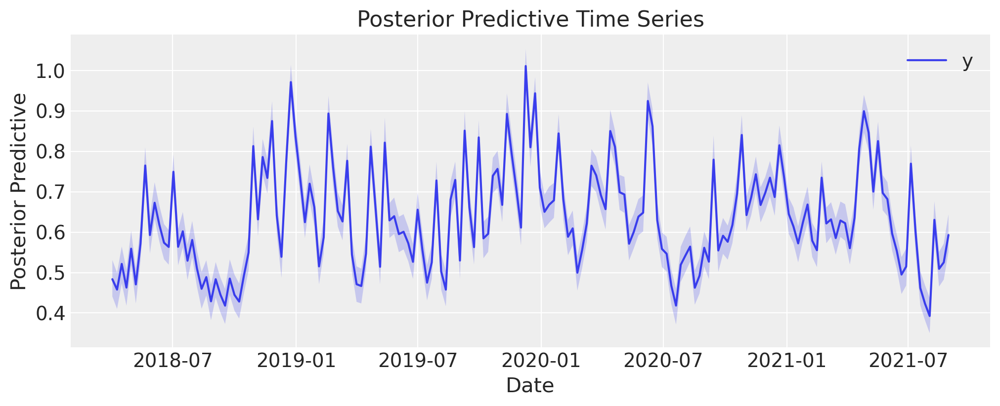

In [77]:
mmm.plot.posterior_predictive();

But you can also remove the mean and HDI and add a gradient, which shows the range of the posterior predictive distribution.

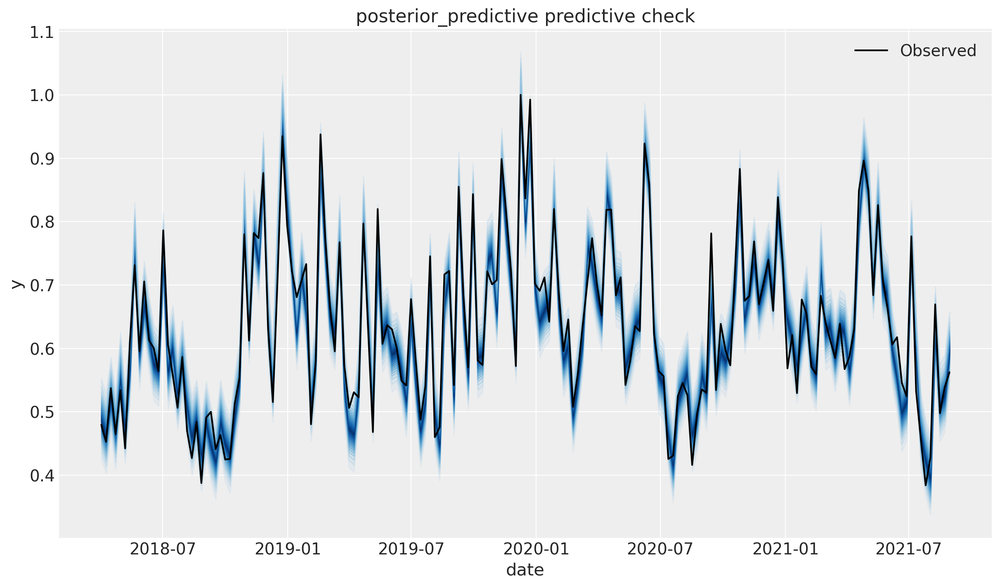

In [37]:
mmm.plot_posterior_predictive(add_mean=False, add_gradient=True);

The fit looks very good (as expected)!

We can inspect the model errors:

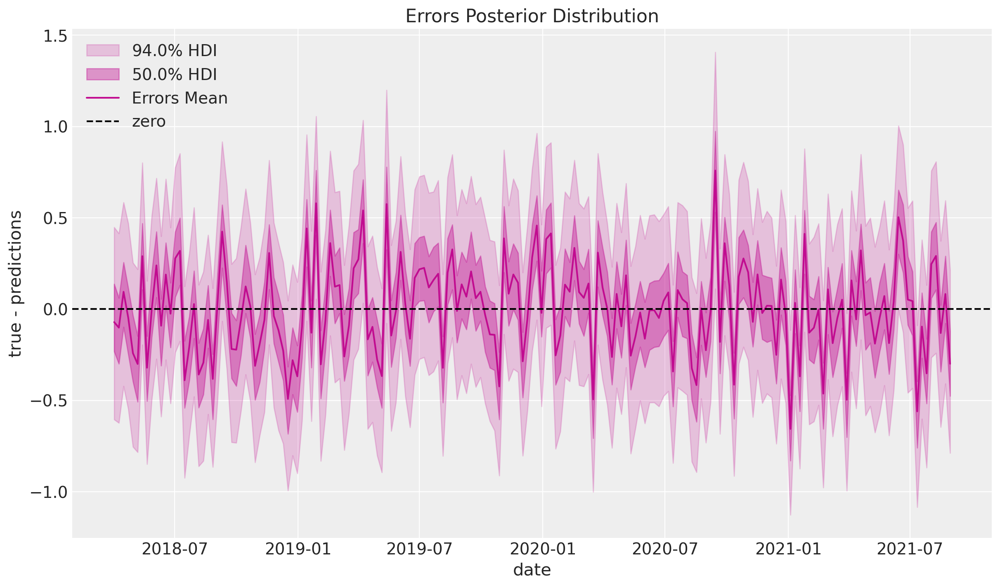

In [38]:
mmm.plot_errors(original_scale=True);

We can actually extract the whole error posterior distribution for custom error analyzes:

In [39]:
errors = mmm.get_errors(original_scale=True)

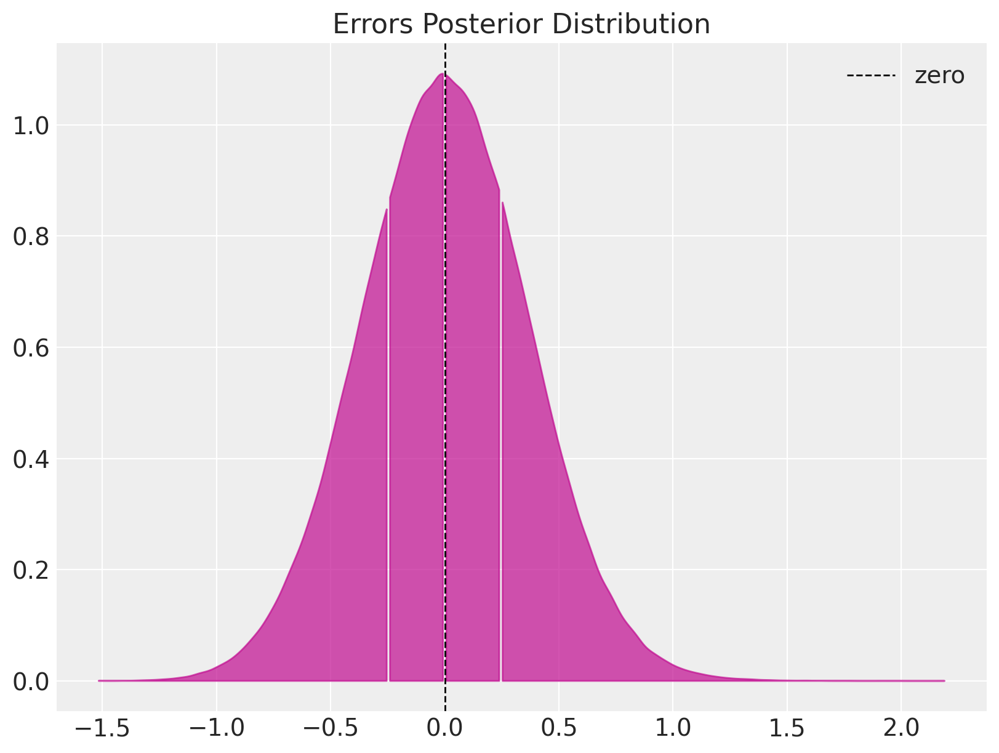

In [40]:
fig, ax = plt.subplots(figsize=(8, 6))
az.plot_dist(
    errors, quantiles=[0.25, 0.5, 0.75], color="C3", fill_kwargs={"alpha": 0.7}, ax=ax
)
ax.axvline(x=0, color="black", linestyle="--", linewidth=1, label="zero")
ax.legend()
ax.set(title="Errors Posterior Distribution");

Next, we can decompose the posterior predictive distribution into the different components:

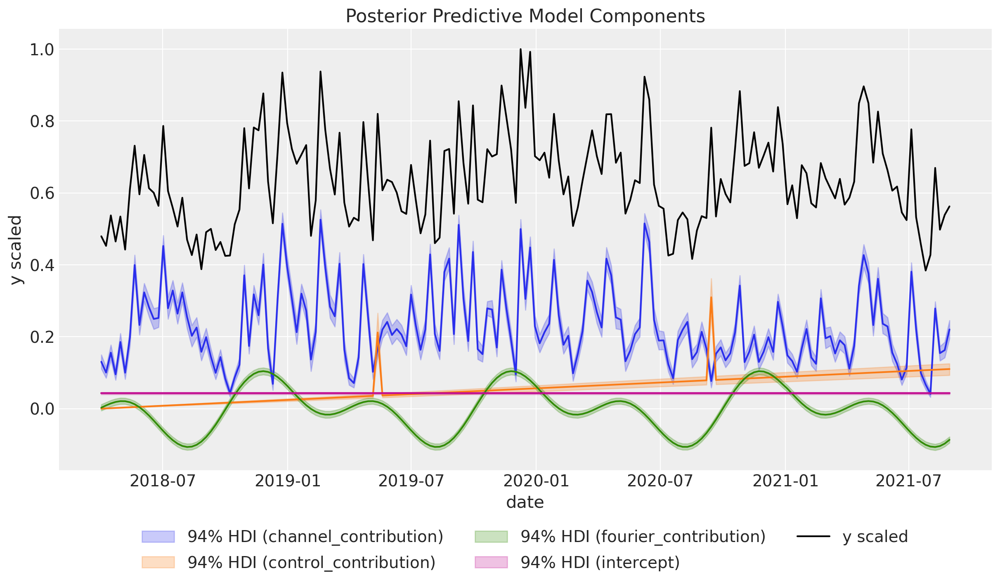

In [41]:
mmm.plot_components_contributions();

**Remark:** This plot shows the decomposition of the normalized target variable when by dividing by its maximum value. Do not forget that internally we are scaling the variables to make the model sample more efficiently. You can recover the transformations from the API methods, e.g.

In [42]:
mmm.get_target_transformer()

,steps,"[('scaler', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True


We plot in the original scale by simply passing the `original_scale=True` argument:

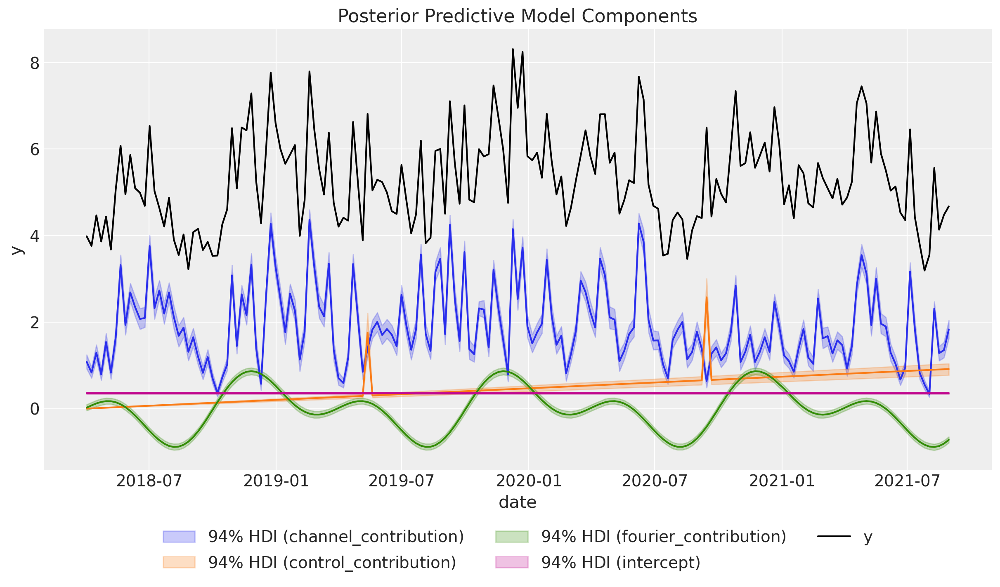

In [43]:
mmm.plot_components_contributions(original_scale=True);

A similar decomposition can be achieved using an area plot:

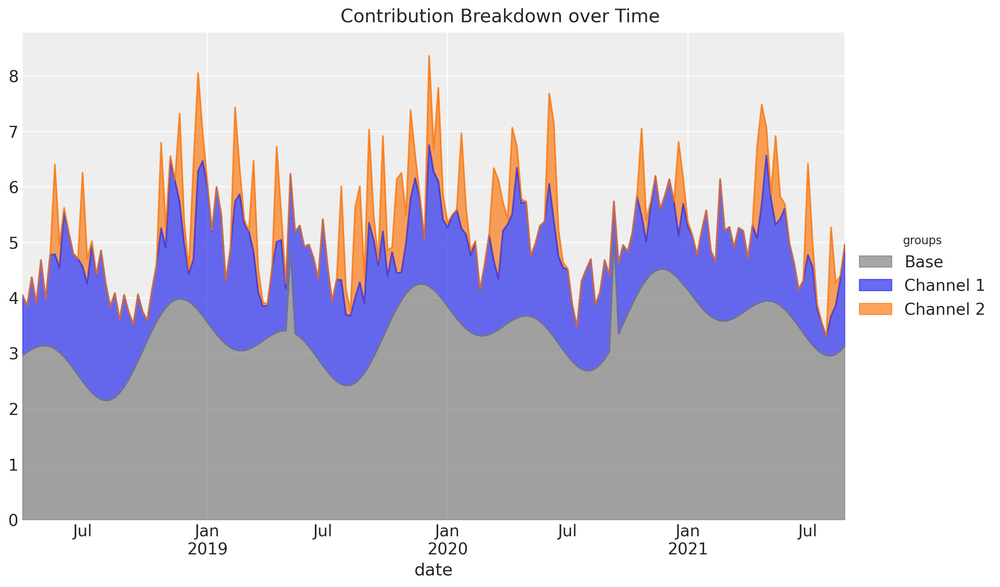

In [44]:
groups = {
    "Base": [
        "intercept",
        "event_1",
        "event_2",
        "t",
        "yearly_seasonality",
    ],
    "Channel 1": ["x1"],
    "Channel 2": ["x2"],
}

fig = mmm.plot_grouped_contribution_breakdown_over_time(
    stack_groups=groups,
    original_scale=True,
    area_kwargs={
        "color": {
            "Channel 1": "C0",
            "Channel 2": "C1",
            "Base": "gray",
            "Seasonality": "black",
        },
        "alpha": 0.7,
    },
)

fig.suptitle("Contribution Breakdown over Time", fontsize=16);

Note that this only works if the contributions of the channel or control variable are strictly positive.

Next, we look into the absolute historical contributions of each component:

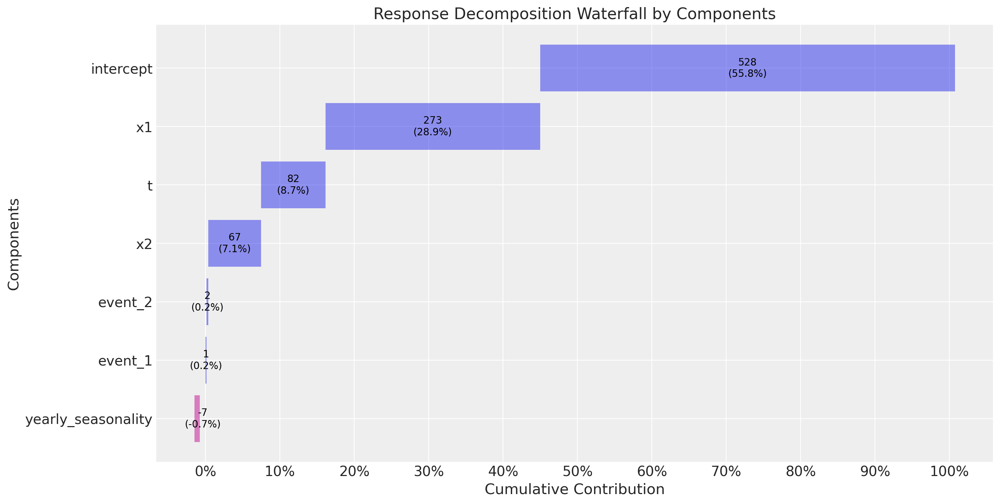

In [45]:
mmm.plot_waterfall_components_decomposition();

Note that we have recovered the true values for all the parameters! Well, in fact the contributions of the `intercept` and `t` are not exactly the same as int the data generating process, but the aggregate does match the true values of `intercept` + `trend`. The reason is that the true latent trend is not completely linear. One could use the time-varying intercept feature to capture this effect.

We can extract the data itself of all the input variables contributions over time, i.e. the regression coefficients times the feature values, as follows:

In [46]:
get_mean_contributions_over_time_df = mmm.compute_mean_contributions_over_time(
    original_scale=True
)

get_mean_contributions_over_time_df.head()

,x1,x2,event_1,event_2,t,yearly_seasonality,intercept
date,,,,,,,
2018-04-02,1.082978,0.0,0.0,0.0,0.000000,0.021653,2.946944
2018-04-09,0.832830,0.0,0.0,0.0,0.005139,0.073830,2.946944
2018-04-16,1.293746,0.0,0.0,0.0,0.010278,0.119767,2.946944
2018-04-23,0.791776,0.0,0.0,0.0,0.015417,0.154140,2.946944
2018-04-30,1.540155,0.0,0.0,0.0,0.020556,0.172363,2.946944


## 5. Media Parameters

We can deep-dive into the media transformation parameters. We want to compare the posterior distributions against the true values.

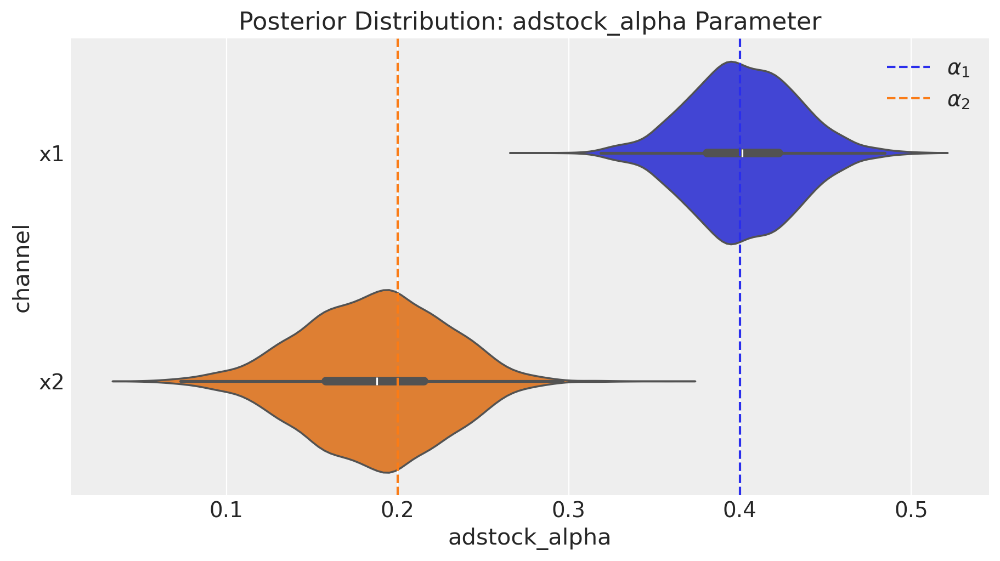

In [47]:
fig = mmm.plot_channel_parameter(param_name="adstock_alpha", figsize=(9, 5))
ax = fig.axes[0]
ax.axvline(x=alpha1, color="C0", linestyle="--", label=r"$\alpha_1$")
ax.axvline(x=alpha2, color="C1", linestyle="--", label=r"$\alpha_2$")
ax.legend(loc="upper right");

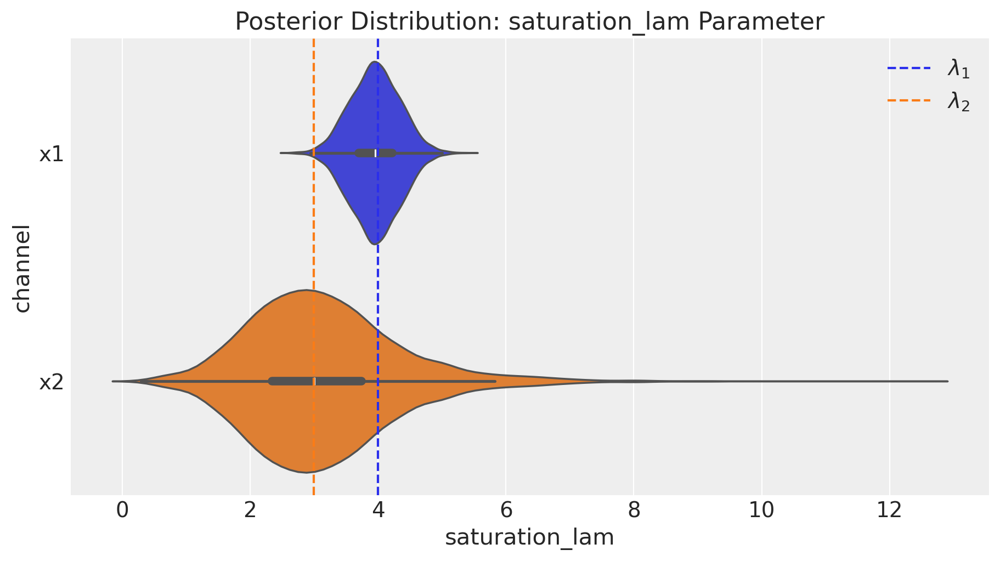

In [48]:
fig = mmm.plot_channel_parameter(param_name="saturation_lam", figsize=(9, 5))
ax = fig.axes[0]
ax.axvline(x=lam1, color="C0", linestyle="--", label=r"$\lambda_1$")
ax.axvline(x=lam2, color="C1", linestyle="--", label=r"$\lambda_2$")
ax.legend(loc="upper right");

We indeed see that our media parameter were successfully recovered!

## 6. Media Deep-Dive

First we can compute the relative contribution of each channel to the target variable. Note that we recover the true values!

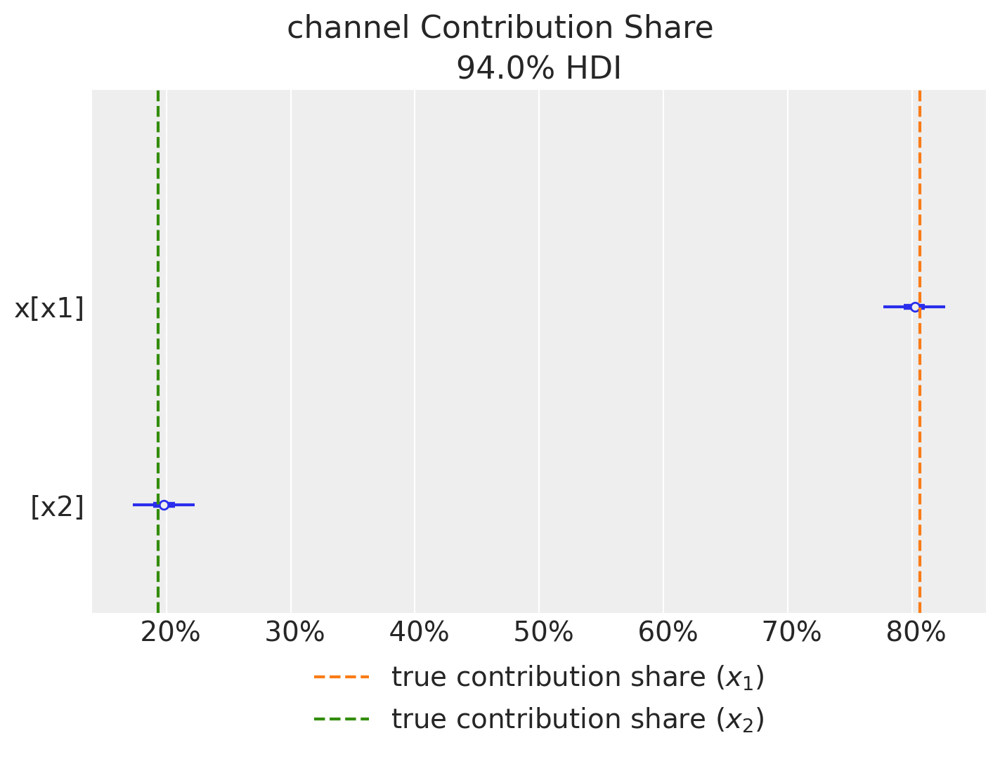

In [49]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(7, 5))
ax = fig.axes[0]
ax.axvline(
    x=contribution_share_x1,
    color="C1",
    linestyle="--",
    label="true contribution share ($x_1$)",
)
ax.axvline(
    x=contribution_share_x2,
    color="C2",
    linestyle="--",
    label="true contribution share ($x_2$)",
)
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=1);

Next, we can plot the relative contribution of each channel to the target variable. 

First we plot the **direct contribution** per channel. Again, we get very close values as the ones obtained in Part I.

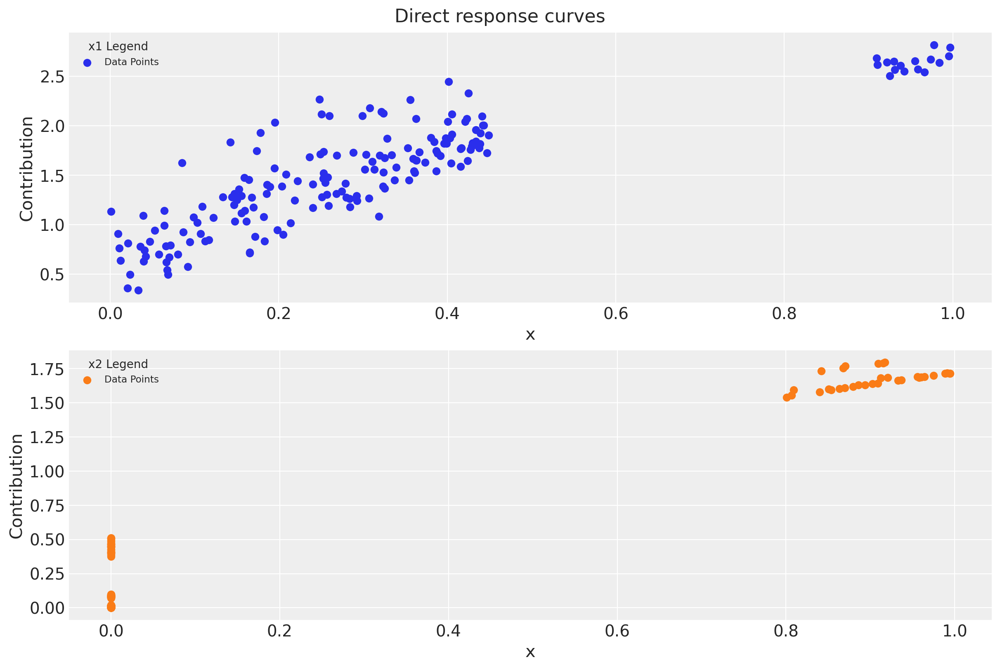

In [50]:
fig = mmm.plot_direct_contribution_curves()
[ax.set(xlabel="x") for ax in fig.axes];

 Note that trying to get the delayed cumulative contribution is not that easy as contributions from the past leak into the future. Specifically, note that we apply the saturation function to the aggregation. As the saturation function is non-linear. This is not the same as taking the sum of the saturation contributions Hence, is very hard to reverse engineer the contribution after carryover and saturation composition this way. 

A more transparent alternative is to evaluate the channel contribution at different share spend levels for the complete training period. Concretely, if the denote by $\delta$ the input channel data percentage level, so that for $\delta = 1$ we have the model input spend data and for $\delta = 1.5$ we have a $50\%$ increase in the spend, then we can compute the channel contribution at a grid of $\delta$-values and plot the results:

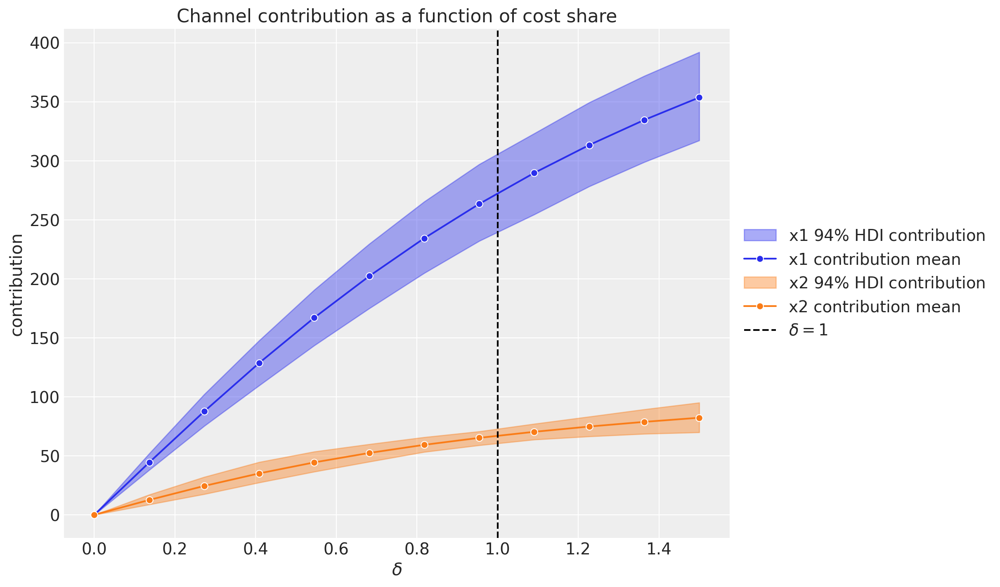

In [51]:
mmm.plot_channel_contribution_grid(start=0, stop=1.5, num=12);

- This plot does account for carryover (adstock) and saturation effects.
- We see that when we have no spend, the contribution is zero (assuming there twas no spend in the past, otherwise the carryover effect would be non-zero).

Observe that these grid values serve as inputs for an optimization step.

We can also plot the same contribution using the x-axis as the total channel input (e.g. total spend in EUR).

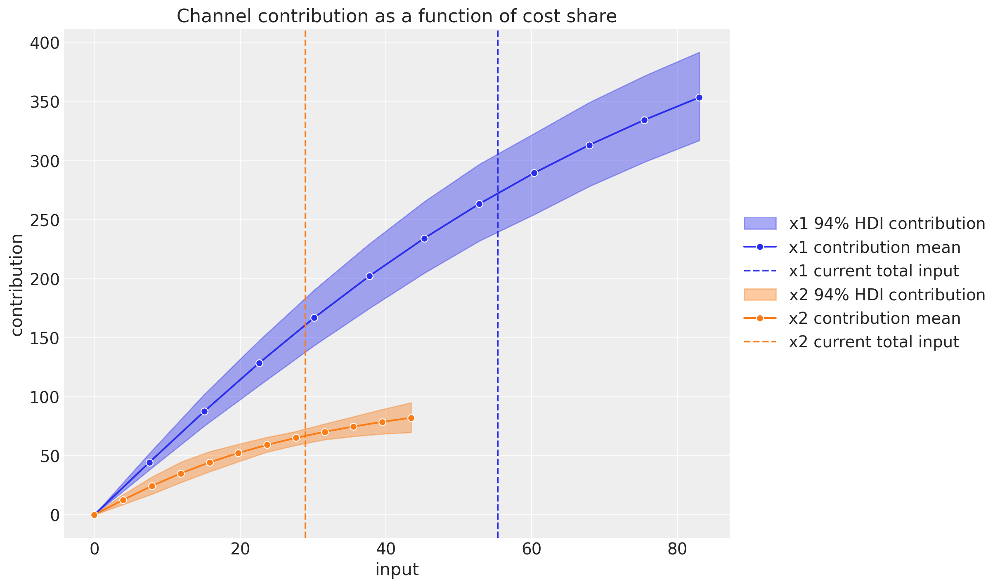

In [52]:
mmm.plot_channel_contribution_grid(start=0, stop=1.5, num=12, absolute_xrange=True);

## 7. Contribution  Recovery

Next, we can plot the direct contribution of each channel to the target variable over time.

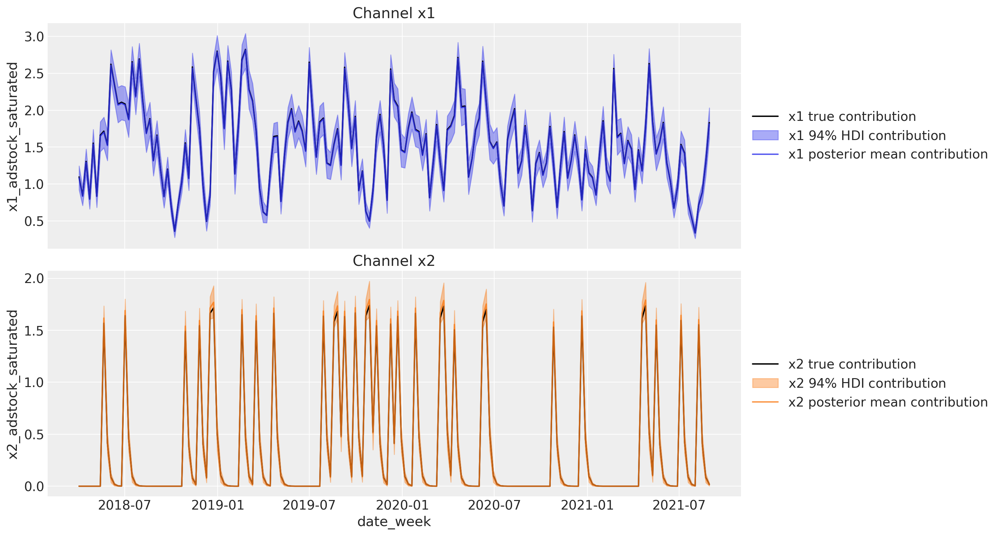

In [53]:
channels_contribution_original_scale = mmm.compute_channel_contribution_original_scale()
channels_contribution_original_scale_hdi = az.hdi(
    ary=channels_contribution_original_scale
)

fig, ax = plt.subplots(
    nrows=2, figsize=(15, 8), ncols=1, sharex=True, sharey=False, layout="constrained"
)

for i, x in enumerate(["x1", "x2"]):
    # Estimate true contribution in the original scale from the data generating process
    sns.lineplot(
        x=df["date_week"],
        y=amplitude * betas[i] * df[f"{x}_adstock_saturated"],
        color="black",
        label=f"{x} true contribution",
        ax=ax[i],
    )
    # HDI estimated contribution in the original scale
    ax[i].fill_between(
        x=df["date_week"],
        y1=channels_contribution_original_scale_hdi.sel(channel=x)["x"][:, 0],
        y2=channels_contribution_original_scale_hdi.sel(channel=x)["x"][:, 1],
        color=f"C{i}",
        label=rf"{x} $94\%$ HDI contribution",
        alpha=0.4,
    )
    # Mean estimated contribution in the original scale
    sns.lineplot(
        x=df["date_week"],
        y=get_mean_contributions_over_time_df[x].to_numpy(),
        color=f"C{i}",
        label=f"{x} posterior mean contribution",
        alpha=0.8,
        ax=ax[i],
    )
    ax[i].legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax[i].set(title=f"Channel {x}")

The results look great! We therefore successfully recovered the true values from the data generation process. We have also seen how easy is to use the {class}`MMM <pymc_marketing.mmm.mmm.MMM>` class to fit media mix models! It takes over the model specification and the media transformations, while having all the flexibility of `pymc`!

## 8. ROAS

Finally, we can compute the (approximate) ROAS posterior distribution for each channel.

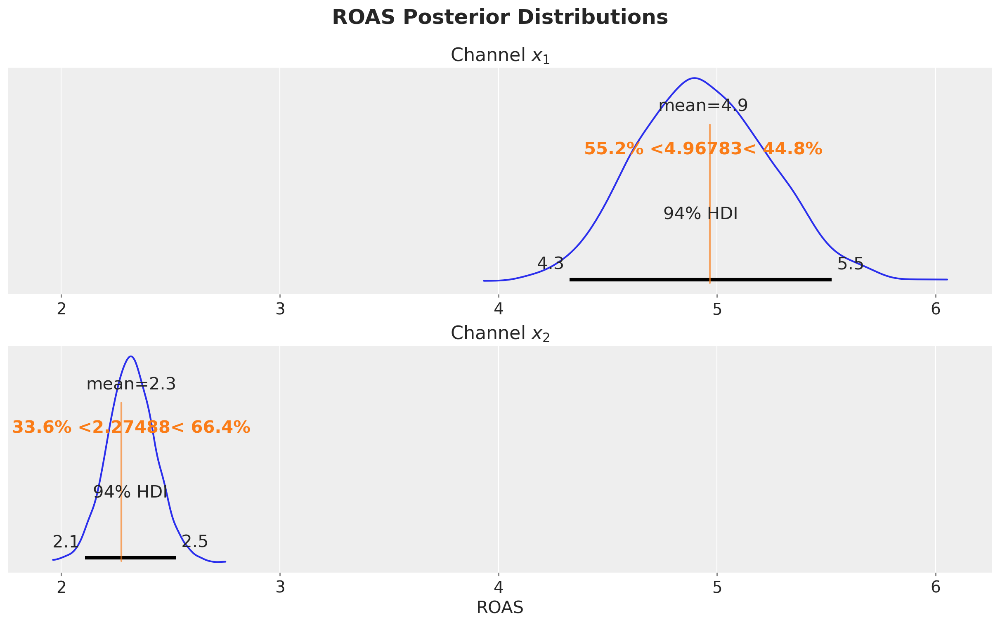

In [54]:
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()
spend_sum = X[["x1", "x2"]].sum().to_numpy()

roas_samples = (
    channel_contribution_original_scale.sum(dim="date")
    / spend_sum[np.newaxis, np.newaxis, :]
)

fig, axes = plt.subplots(
    nrows=2, ncols=1, figsize=(12, 7), sharex=True, sharey=False, layout="constrained"
)
az.plot_posterior(roas_samples, ref_val=[roas_1, roas_2], ax=axes)
axes[0].set(title="Channel $x_{1}$")
axes[1].set(title="Channel $x_{2}$", xlabel="ROAS")
fig.suptitle("ROAS Posterior Distributions", fontsize=18, fontweight="bold", y=1.06);

We see that the ROAS posterior distributions are centered around the true values! We also see that, even considering the uncertainty, channel $x_{1}$ is more efficient than channel $x_{2}$. 

It is also useful to compare the ROAS and the contribution share. In the next plot we plot these two these two inferred estimates per channel.

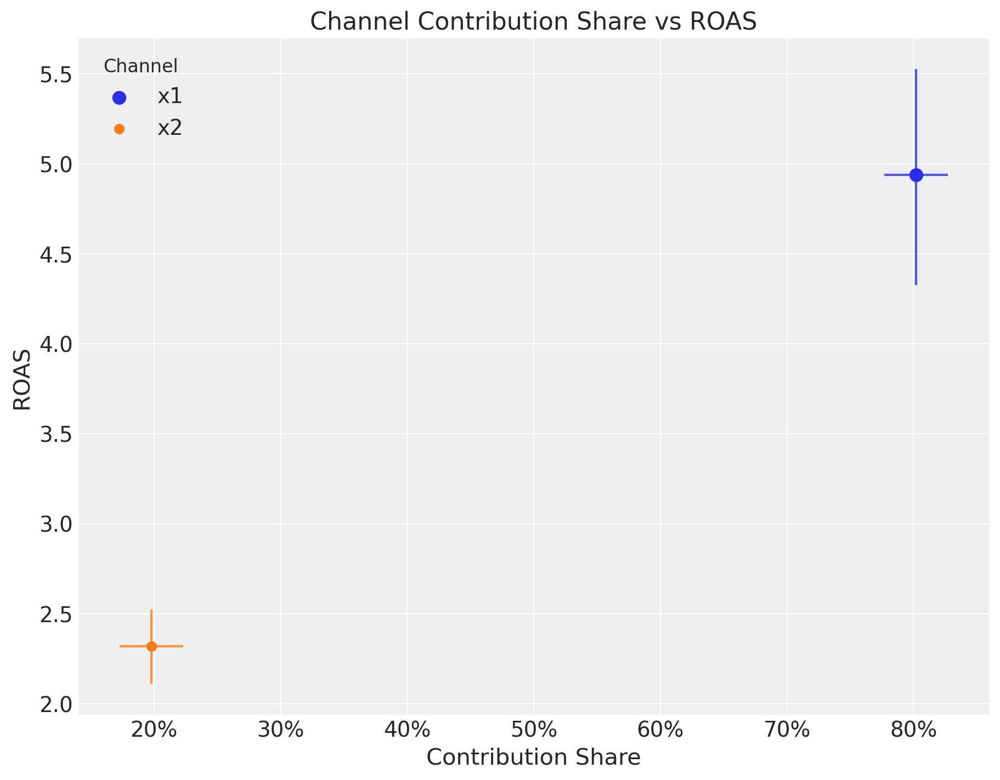

In [55]:
# Get the contribution share samples
share_samples = mmm.get_channel_contribution_share_samples()

fig, ax = plt.subplots(figsize=(9, 7))

for i, channel in enumerate(["x1", "x2"]):
    # Contribution share mean and hdi
    share_mean = share_samples.sel(channel=channel).mean().to_numpy()
    share_hdi = az.hdi(share_samples.sel(channel=channel))["x"].to_numpy()

    # ROAS mean and hdi
    roas_mean = roas_samples.sel(channel=channel).mean().to_numpy()
    roas_hdi = az.hdi(roas_samples.sel(channel=channel))["x"].to_numpy()

    # Plot the contribution share hdi
    ax.vlines(share_mean, roas_hdi[0], roas_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the ROAS hdi
    ax.hlines(roas_mean, share_hdi[0], share_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the means
    ax.scatter(
        share_mean,
        roas_mean,
        # Size of the scatter points is proportional to the spend share
        s=spend_share[channel] * 100,
        color=f"C{i}",
        label=channel,
    )
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))

ax.legend(loc="upper left", title="Channel", title_fontsize=12)
ax.set(
    title="Channel Contribution Share vs ROAS",
    xlabel="Contribution Share",
    ylabel="ROAS",
);

This plot is very effective summarizing channel efficiency. In this example, it turns out that the most efficient channel $x_1$ has a higher contribution share than the less efficient channel $x_2$.

## 9. Out of Sample Predictions

Out of sample predictions are done with the `predict` and `posterior_predictive` methods. These include 

- `sample_posterior_predictive` : Get the full posterior predictive distribution
- `predict`: Get the mean of the posterior predictive distribution

These methods take new data, `X`, and some additional `kwargs` for new predictions. Namely, 

- `include_last_observations` : boolean flag in order to carry adstock effects from last observations in the training dataset

The new data needs to have all the features that are specified in the model. There is no need to worry about: 

- input scaling of channel spends
- creating fourier transformations on the `date_column`
- inverse scaling back to target domain

That will be done automatically! However, please note that control variables are NOT automatically scaled - if needed, you must scale them before passing the data to the model.

In [56]:
last_date = X["date_week"].max()

# New dates starting from last in dataset
n_new = 5
new_dates = pd.date_range(start=last_date, periods=1 + n_new, freq="W-MON")[1:]

X_out_of_sample = pd.DataFrame(
    {
        "date_week": new_dates,
    }
)

# Same channel spends as last day
X_out_of_sample["x1"] = X["x1"].iloc[-1]
X_out_of_sample["x2"] = X["x2"].iloc[-1]

# Other features
X_out_of_sample["event_1"] = 0
X_out_of_sample["event_2"] = 0

X_out_of_sample["t"] = range(len(X), len(X) + n_new)

X_out_of_sample

,date_week,x1,x2,event_1,event_2,t
0,2021-09-06,0.438857,0.0,0,0,179
1,2021-09-13,0.438857,0.0,0,0,180
2,2021-09-20,0.438857,0.0,0,0,181
3,2021-09-27,0.438857,0.0,0,0,182
4,2021-10-04,0.438857,0.0,0,0,183


Call the desired method to get the new samples! The new coordinates will be from the new dates

In [57]:
X_out_of_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_week  5 non-null      datetime64[ns]
 1   x1         5 non-null      float64       
 2   x2         5 non-null      float64       
 3   event_1    5 non-null      int64         
 4   event_2    5 non-null      int64         
 5   t          5 non-null      int64         
dtypes: datetime64[ns](1), float64(2), int64(3)
memory usage: 372.0 bytes


In [58]:
y_out_of_sample = mmm.sample_posterior_predictive(X_out_of_sample, extend_idata=False)
y_out_of_sample

/opt/anaconda3/envs/pymc-marketing-dev/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

<xarray.Dataset> Size: 256kB
Dimensions:  (date: 5, sample: 4000)
Coordinates:
  * date     (date) datetime64[ns] 40B 2021-09-06 2021-09-13 ... 2021-10-04
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 160kB 4.901 4.049 4.769 ... 6.083 5.878
Attributes:
    created_at:                 2025-08-07T14:12:50.927766+00:00
    arviz_version:              0.22.0
    inference_library:          pymc
    inference_library_version:  5.25.1

**NOTE:** If the method is being called **multiple times**, set the `extend_idata` argument to False in order to not overwrite the `observed_data` in the `InferenceData`

The new predictions are transformed back to the original scale of the target by default. That can be seen below: 

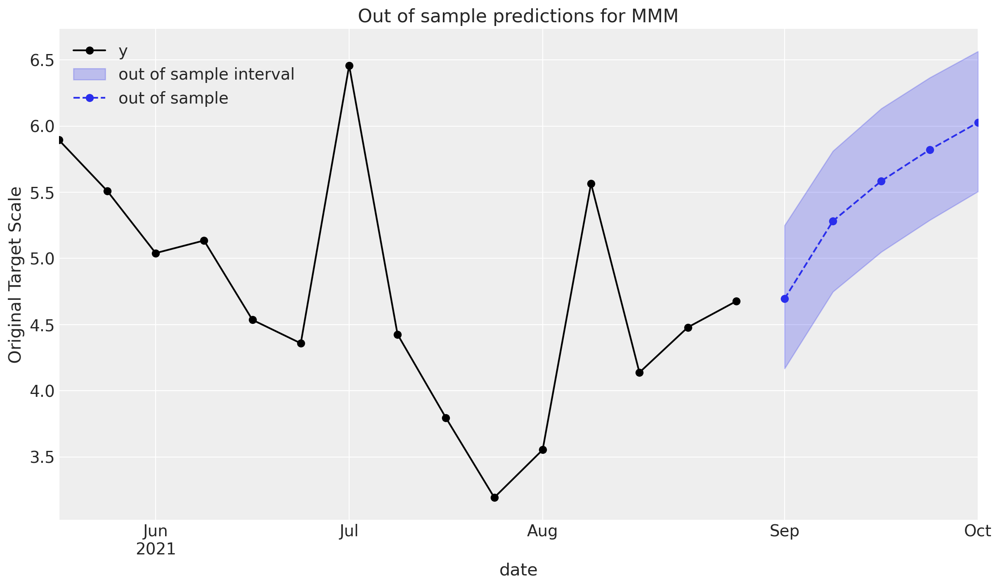

In [59]:
def plot_in_sample(X, y, ax, n_points: int = 15):
    (
        y.to_frame()
        .set_index(X["date_week"])
        .iloc[-n_points:]
        .plot(ax=ax, marker="o", color="black", label="actuals")
    )
    return ax


def plot_out_of_sample(X_out_of_sample, y_out_of_sample, ax, color, label):
    y_out_of_sample_groupby = y_out_of_sample["y"].to_series().groupby("date")

    lower, upper = quantiles = [0.025, 0.975]
    conf = y_out_of_sample_groupby.quantile(quantiles).unstack()
    ax.fill_between(
        X_out_of_sample["date_week"].dt.to_pydatetime(),
        conf[lower],
        conf[upper],
        alpha=0.25,
        color=color,
        label=f"{label} interval",
    )

    mean = y_out_of_sample_groupby.mean()
    mean.plot(ax=ax, marker="o", label=label, color=color, linestyle="--")
    ax.set(ylabel="Original Target Scale", title="Out of sample predictions for MMM")
    return ax


_, ax = plt.subplots()
plot_in_sample(X, y, ax=ax)
plot_out_of_sample(
    X_out_of_sample, y_out_of_sample, ax=ax, label="out of sample", color="C0"
)
ax.legend(loc="upper left");

If the out of sample data is being extended from the original predictions, consider setting the `include_last_observations` to True in order to carry over the effects from the last channel spends in the training set. 

The predictions are higher since the channel contributions the final spends still have an impact that eventually subside.

In [60]:
y_out_of_sample_with_adstock = mmm.sample_posterior_predictive(
    X_out_of_sample, extend_idata=False, include_last_observations=True
)

/opt/anaconda3/envs/pymc-marketing-dev/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

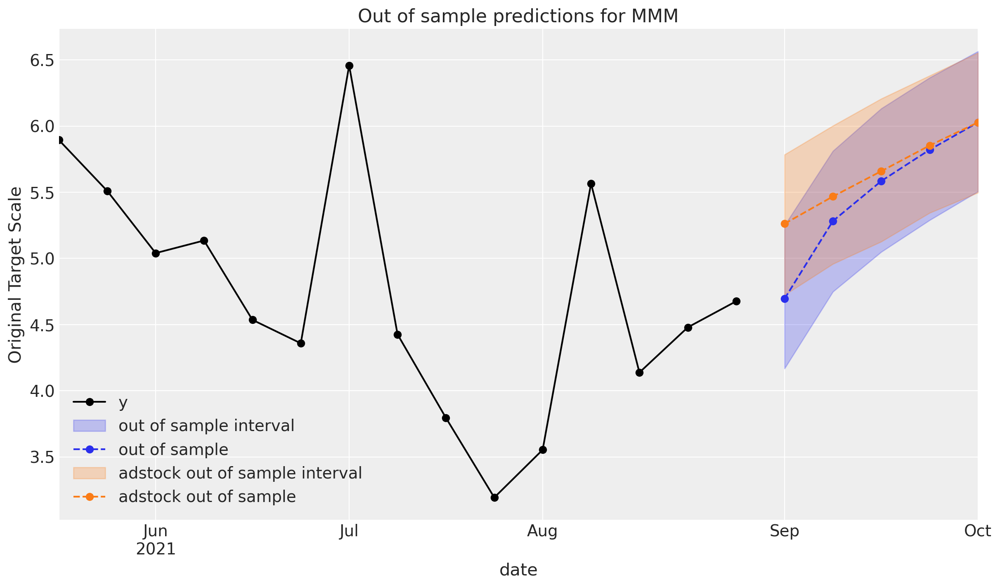

In [61]:
_, ax = plt.subplots()
plot_in_sample(X, y, ax=ax)
plot_out_of_sample(
    X_out_of_sample, y_out_of_sample, ax=ax, label="out of sample", color="C0"
)
plot_out_of_sample(
    X_out_of_sample,
    y_out_of_sample_with_adstock,
    ax=ax,
    label="adstock out of sample",
    color="C1",
)
ax.legend();

Finally we can use the model to understand the expected sales for different media spend scenarios considering the adstock and saturation effects learned from the data.

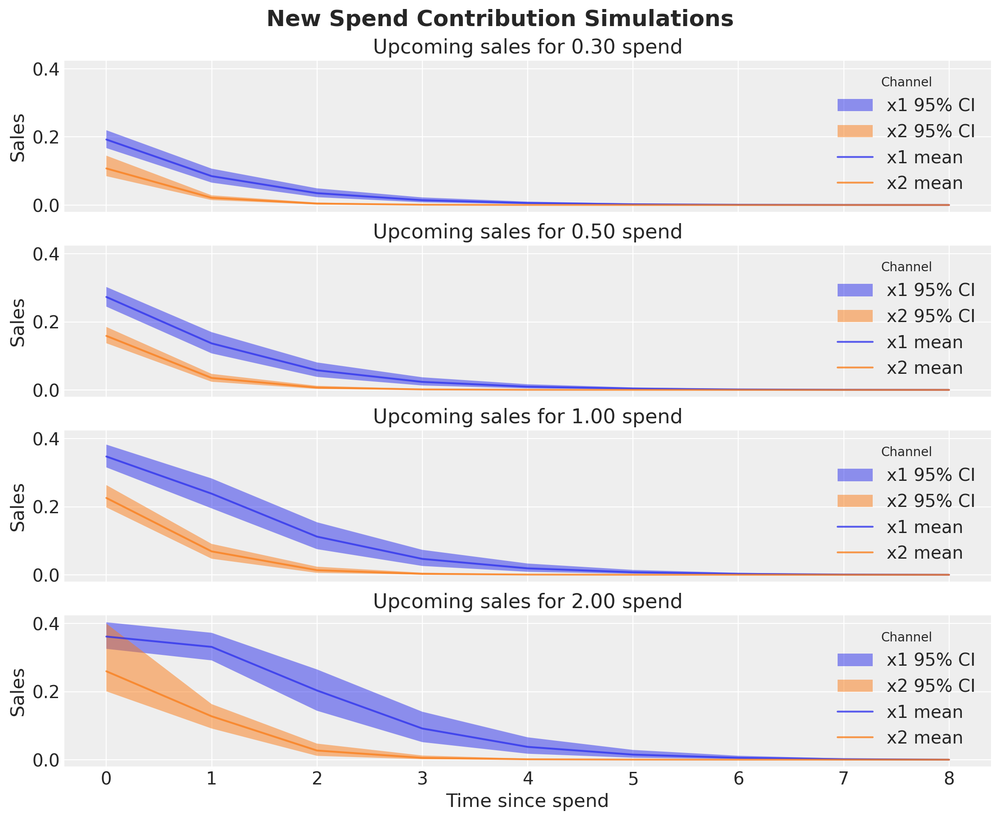

In [62]:
spends = [0.3, 0.5, 1, 2]

fig, axes = plt.subplots(
    nrows=len(spends),
    ncols=1,
    figsize=(11, 9),
    sharex=True,
    sharey=True,
    layout="constrained",
)

axes = axes.flatten()

for ax, spend in zip(axes, spends, strict=True):
    mmm.plot_new_spend_contributions(spend_amount=spend, progressbar=False, ax=ax)

fig.suptitle("New Spend Contribution Simulations", fontsize=18, fontweight="bold");

We clearly see that since $x_1$ has a higher adstock parameter $\alpha$ than $x_2$, then for new spend on a single date (i.e. `one_time`) 
$x_1$ has larger delayed contributions than $x_2$.

## 10. Save Model
After your model is train, you can quickly save it using the `save` method. For more information about model deployment see {ref}`model_deployment`.

In [ ]:
mmm.save("model.nc", engine="h5netcdf")

In [2]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pymc_marketing,pytensor

Last updated: Wed Oct 08 2025

Python implementation: CPython
Python version       : 3.12.11
IPython version      : 9.3.0

pymc_marketing: 0.15.1
pytensor      : 2.31.7

graphviz: 0.21

Watermark: 2.5.0

